In [ ]:
import os

SAVE_IMAGE_DIR = "/content/drive/MyDrive/processed_updtrain2017"
SAVE_MASK_DIR = "/content/drive/MyDrive/processed_mask_train2017"

os.makedirs(SAVE_IMAGE_DIR, exist_ok=True)
os.makedirs(SAVE_MASK_DIR, exist_ok=True)



In [ ]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!wget http://images.cocodataset.org/zips/train2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip

--2025-11-20 05:36:28--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.182.41.137, 52.217.138.241, 16.182.103.209, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.182.41.137|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  58.1MB/s    in 4.6s    

2025-11-20 05:36:32 (52.9 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

--2025-11-20 05:36:32--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.182.41.137, 52.217.138.241, 16.182.103.209, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.182.41.137|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train20

In [ ]:
!unzip -qq train2017.zip -d train2017
!unzip -qq val2017.zip -d val2017
!unzip -qq annotations_trainval2017.zip -d annotations


In [ ]:
!pip install pycocotools


In [ ]:
import os
from pycocotools.coco import COCO
import numpy as np
from PIL import Image

ANNOT_PATH = 'annotations/annotations/instances_train2017.json'
IMAGE_DIR = 'train2017'
MASK_OUT_DIR = 'annotations/generated_masks'
os.makedirs(MASK_OUT_DIR, exist_ok=True)

coco = COCO(ANNOT_PATH)
img_ids = coco.getImgIds()

for img_id in img_ids:
    img_info = coco.loadImgs(img_id)[0]
    file_name = img_info['file_name']
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    for ann in anns:
        mask |= coco.annToMask(ann)  # Combine all objects as foreground (value: 1)
    mask_img = Image.fromarray(mask)

    mask_img.save(os.path.join(MASK_OUT_DIR, file_name.replace('.jpg', '.png')))


loading annotations into memory...


KeyboardInterrupt: 

In [ ]:
import os
from PIL import Image
import numpy as np
import torchvision.transforms as T
import torch

def apply_seed(transform, image, seed):
    torch.manual_seed(seed)
    return transform(image)

def get_image_pipeline():
    return T.Compose([
        T.Resize((450, 450)),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomRotation(degrees=20),
        T.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.4, hue=0.1),
        T.RandomApply([T.GaussianBlur(kernel_size=5)], p=0.5),
        T.RandomApply([T.RandomAdjustSharpness(sharpness_factor=2)], p=0.3),
        T.ToTensor(),
    ])

def get_mask_pipeline():
    return T.Compose([
        T.Resize((450, 450), interpolation=Image.NEAREST),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomRotation(degrees=20),
    ])

image_pipeline = get_image_pipeline()
mask_pipeline = get_mask_pipeline()

IMAGE_DIR = "train2017/train2017"
MASK_DIR = "annotations/generated_masks"
SAVE_IMAGE_DIR = "/content/drive/MyDrive/processed_updtrain2017"
SAVE_MASK_DIR = "/content/drive/MyDrive/processed_mask_train2017"
os.makedirs(SAVE_IMAGE_DIR, exist_ok=True)
os.makedirs(SAVE_MASK_DIR, exist_ok=True)

# Get all image filenames and expected mask filenames
all_images = [fname for fname in os.listdir(IMAGE_DIR) if fname.endswith('.jpg')]
all_masks = [fname.replace('.jpg', '.png') for fname in all_images]

# Get already processed filenames in Drive (for images and masks)
already_processed_imgs = set(os.listdir(SAVE_IMAGE_DIR))
already_processed_masks = set(os.listdir(SAVE_MASK_DIR))

# Only keep those that need to be processed
to_process = [(img, mask) for img, mask in zip(all_images, all_masks)
              if img not in already_processed_imgs and mask not in already_processed_masks]

batch_size = 1000

for i in range(0, len(to_process), batch_size):
    batch_items = to_process[i:i+batch_size]
    for img_fname, mask_fname in batch_items:
        orig_img = Image.open(os.path.join(IMAGE_DIR, img_fname)).convert('RGB')
        orig_mask = Image.open(os.path.join(MASK_DIR, mask_fname))

        seed = np.random.randint(10000)
        proc_img = apply_seed(image_pipeline, orig_img, seed)
        proc_mask_img = apply_seed(mask_pipeline, orig_mask, seed)

        processed_img_pil = T.ToPILImage()(proc_img)
        processed_img_pil.save(os.path.join(SAVE_IMAGE_DIR, img_fname))
        proc_mask_img.save(os.path.join(SAVE_MASK_DIR, mask_fname))

    print(f"✅ Completed batch {i // batch_size + 1} of {(len(to_process) + batch_size - 1) // batch_size}, processed {len(batch_items)} pairs.")

print("🎉 All remaining images and masks processed and saved batch-wise (resumed run).")

✅ Completed batch 1 of 20, processed 1000 pairs.
✅ Completed batch 2 of 20, processed 1000 pairs.
✅ Completed batch 3 of 20, processed 1000 pairs.
✅ Completed batch 4 of 20, processed 1000 pairs.
✅ Completed batch 5 of 20, processed 1000 pairs.
✅ Completed batch 6 of 20, processed 1000 pairs.
✅ Completed batch 7 of 20, processed 1000 pairs.
✅ Completed batch 8 of 20, processed 1000 pairs.
✅ Completed batch 9 of 20, processed 1000 pairs.
✅ Completed batch 10 of 20, processed 1000 pairs.
✅ Completed batch 11 of 20, processed 1000 pairs.
✅ Completed batch 12 of 20, processed 1000 pairs.
✅ Completed batch 13 of 20, processed 1000 pairs.
✅ Completed batch 14 of 20, processed 1000 pairs.
✅ Completed batch 15 of 20, processed 1000 pairs.
✅ Completed batch 16 of 20, processed 1000 pairs.
✅ Completed batch 17 of 20, processed 1000 pairs.
✅ Completed batch 18 of 20, processed 1000 pairs.
✅ Completed batch 19 of 20, processed 1000 pairs.
✅ Completed batch 20 of 20, processed 456 pairs.
🎉 All rema

In [ ]:
import os
from PIL import Image
import numpy as np

PROCESSED_MASK_DIR = "/content/drive/MyDrive/processed_mask_train2017"
BINARY_MASK_DIR = "/content/drive/MyDrive/binary_masking_train2017"
os.makedirs(BINARY_MASK_DIR, exist_ok=True)

all_mask_files = sorted(os.listdir(PROCESSED_MASK_DIR))  # Ensures order

batch_size = 500
total_batches = (len(all_mask_files) + batch_size - 1) // batch_size

for i in range(0, len(all_mask_files), batch_size):
    batch_files = all_mask_files[i : i + batch_size]
    for mask_fname in batch_files:
        mask_path = os.path.join(PROCESSED_MASK_DIR, mask_fname)
        mask = np.array(Image.open(mask_path))
        binary = np.where(mask > 0, 255, 0).astype(np.uint8)
        Image.fromarray(binary).save(os.path.join(BINARY_MASK_DIR, mask_fname))
    print(f"✅ Completed batch {i//batch_size+1} of {total_batches}, processed {len(batch_files)} binary masks.")

print("🎉 All binary masks created and saved in:", BINARY_MASK_DIR)



✅ Completed batch 1 of 237, processed 500 binary masks.
✅ Completed batch 2 of 237, processed 500 binary masks.
✅ Completed batch 3 of 237, processed 500 binary masks.
✅ Completed batch 4 of 237, processed 500 binary masks.
✅ Completed batch 5 of 237, processed 500 binary masks.
✅ Completed batch 6 of 237, processed 500 binary masks.
✅ Completed batch 7 of 237, processed 500 binary masks.
✅ Completed batch 8 of 237, processed 500 binary masks.
✅ Completed batch 9 of 237, processed 500 binary masks.
✅ Completed batch 10 of 237, processed 500 binary masks.
✅ Completed batch 11 of 237, processed 500 binary masks.
✅ Completed batch 12 of 237, processed 500 binary masks.
✅ Completed batch 13 of 237, processed 500 binary masks.
✅ Completed batch 14 of 237, processed 500 binary masks.
✅ Completed batch 15 of 237, processed 500 binary masks.
✅ Completed batch 16 of 237, processed 500 binary masks.
✅ Completed batch 17 of 237, processed 500 binary masks.
✅ Completed batch 18 of 237, processed 5

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
from PIL import Image
import numpy as np

PROCESSED_MASK_DIR = "/content/drive/MyDrive/processed_mask_train2017"
BINARY_MASK_DIR = "/content/drive/MyDrive/binary_masking_train2017"
os.makedirs(BINARY_MASK_DIR, exist_ok=True)

all_mask_files = sorted(os.listdir(PROCESSED_MASK_DIR))
already_processed = set(os.listdir(BINARY_MASK_DIR))
to_process = [f for f in all_mask_files if f not in already_processed]

batch_size = 1000
total_batches = (len(to_process) + batch_size - 1) // batch_size

for i in range(0, len(to_process), batch_size):
    batch_files = to_process[i : i + batch_size]
    for mask_fname in batch_files:
        mask_path = os.path.join(PROCESSED_MASK_DIR, mask_fname)
        mask = np.array(Image.open(mask_path))
        binary = np.where(mask > 0, 255, 0).astype(np.uint8)
        Image.fromarray(binary).save(os.path.join(BINARY_MASK_DIR, mask_fname))
    print(f"✅ Completed batch {i//batch_size+1} of {total_batches}, processed {len(batch_files)} binary masks.")

print("🎉 All remaining binary masks have been saved to:", BINARY_MASK_DIR)


KeyboardInterrupt: 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

IMG_DIR = "/content/drive/MyDrive/processed_updtrain2017"
MASK_DIR = "/content/drive/MyDrive/binary_masking_train2017"

N = 1000    # batch size: train on next 400 images
skip = 9500 # skip previously trained images

all_pairs = []
for mask_name in sorted(os.listdir(MASK_DIR)):
    if mask_name.endswith('.png'):
        img_name = mask_name.replace('.png', '.jpg')
        img_path = os.path.join(IMG_DIR, img_name)
        mask_path = os.path.join(MASK_DIR, mask_name)
        if os.path.exists(img_path):
            all_pairs.append((img_path, mask_path))

batch_pairs = all_pairs[skip:skip+N]
img_file_list, mask_file_list = zip(*batch_pairs)


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
import torchvision.transforms as T

class SegmentationPairedDataset(Dataset):
    def __init__(self, img_files, mask_files):
        self.img_files = img_files
        self.mask_files = mask_files
        self.transform_img = T.Compose([T.Resize((224,224)), T.ToTensor()])
        self.transform_mask = T.Compose([T.Resize((224,224)), T.ToTensor()])

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        image = Image.open(self.img_files[idx]).convert('RGB')
        mask = Image.open(self.mask_files[idx]).convert('L')
        image = self.transform_img(image)
        mask = self.transform_mask(mask)
        mask = (mask > 0.5).float()
        return image, mask

dataset = SegmentationPairedDataset(img_file_list, mask_file_list)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_ds, val_ds = random_split(dataset, [train_size, val_size], generator=torch.Generator().manual_seed(42))
train_loader = DataLoader(train_ds, batch_size=4, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=4, shuffle=False)


In [ ]:
from torch.utils.data import random_split, DataLoader

dataset = SegmentationPairedDataset(img_file_list, mask_file_list)
total = len(dataset)
train_size = int(0.8 * total)
val_size = total - train_size

train_ds, val_ds = random_split(dataset, [train_size, val_size], generator=torch.Generator().manual_seed(42))
train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=0)
val_loader = DataLoader(val_ds, batch_size=4, shuffle=False, num_workers=0)


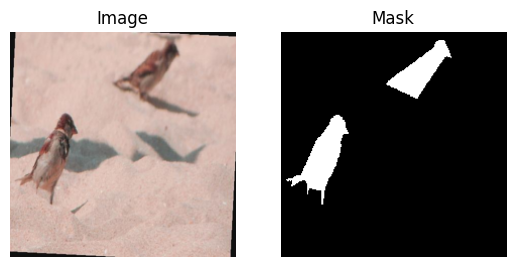

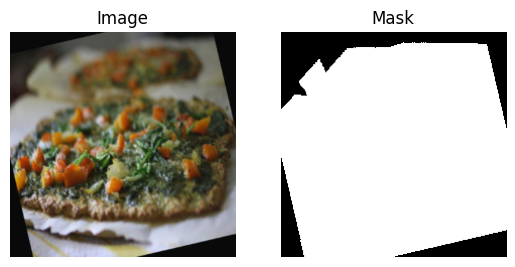

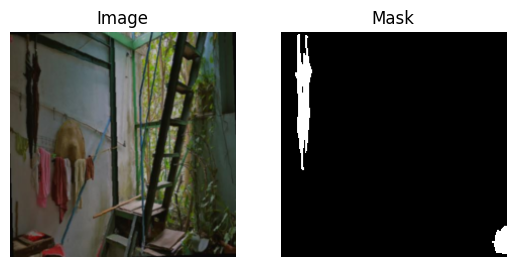

In [ ]:
# OPTIONAL: Check first 3 pairs just to confirm correct mapping!
for i in range(3):
    img, mask = dataset[i]
    import matplotlib.pyplot as plt
    plt.subplot(1,2,1); plt.imshow(img.permute(1,2,0)); plt.title('Image'); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(mask[0], cmap='gray'); plt.title('Mask'); plt.axis('off')
    plt.show()


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

# Basic U-Net building blocks
class DoubleConv(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_c, out_c, 3, padding=1),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.dconv_down1 = DoubleConv(3, 64)
        self.dconv_down2 = DoubleConv(64, 128)
        self.dconv_down3 = DoubleConv(128, 256)
        self.dconv_down4 = DoubleConv(256, 512)

        self.maxpool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.dconv_up3 = DoubleConv(256 + 512, 256)
        self.dconv_up2 = DoubleConv(128 + 256, 128)
        self.dconv_up1 = DoubleConv(128 + 64, 64)

        self.conv_last = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        # encoder
        conv1 = self.dconv_down1(x)
        x = self.maxpool(conv1)

        conv2 = self.dconv_down2(x)
        x = self.maxpool(conv2)

        conv3 = self.dconv_down3(x)
        x = self.maxpool(conv3)

        x = self.dconv_down4(x)

        # decoder
        x = self.upsample(x)
        x = torch.cat([x, conv3], dim=1)

        x = self.dconv_up3(x)
        x = self.upsample(x)
        x = torch.cat([x, conv2], dim=1)

        x = self.dconv_up2(x)
        x = self.upsample(x)
        x = torch.cat([x, conv1], dim=1)

        x = self.dconv_up1(x)

        out = self.conv_last(x)
        return torch.sigmoid(out)


In [ ]:
def iou_score(y_pred, y_true, smooth=1e-6):
    y_pred = (y_pred > 0.5).float()
    y_true = (y_true > 0.5).float()
    intersection = (y_pred * y_true).sum()
    union = y_pred.sum() + y_true.sum() - intersection
    return ((intersection + smooth) / (union + smooth)).item()


In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 10  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


KeyboardInterrupt: 

Resuming from epoch 20
Epoch 21, Batch 0/100
Epoch 21, Batch 10/100
Epoch 21, Batch 20/100
Epoch 21, Batch 30/100
Epoch 21, Batch 40/100
Epoch 21, Batch 50/100
Epoch 21, Batch 60/100
Epoch 21, Batch 70/100
Epoch 21, Batch 80/100
Epoch 21, Batch 90/100
Epoch 21/30, Train Loss: 0.4864, Val Loss: 0.4747, Val IoU: 0.4001
Epoch 22, Batch 0/100
Epoch 22, Batch 10/100
Epoch 22, Batch 20/100
Epoch 22, Batch 30/100
Epoch 22, Batch 40/100
Epoch 22, Batch 50/100
Epoch 22, Batch 60/100
Epoch 22, Batch 70/100
Epoch 22, Batch 80/100
Epoch 22, Batch 90/100
Epoch 22/30, Train Loss: 0.4782, Val Loss: 0.4610, Val IoU: 0.3154
Visualizing predictions after epoch 22


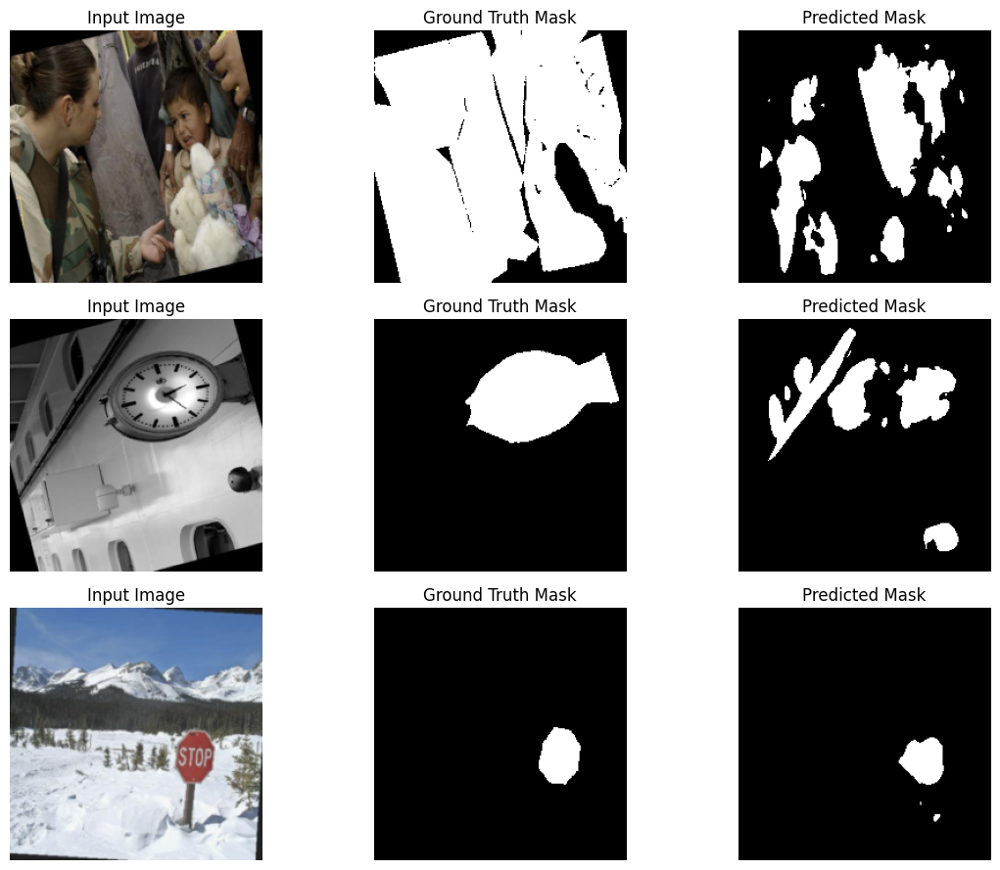

Epoch 23, Batch 0/100
Epoch 23, Batch 10/100
Epoch 23, Batch 20/100
Epoch 23, Batch 30/100
Epoch 23, Batch 40/100
Epoch 23, Batch 50/100
Epoch 23, Batch 60/100
Epoch 23, Batch 70/100
Epoch 23, Batch 80/100
Epoch 23, Batch 90/100
Epoch 23/30, Train Loss: 0.4657, Val Loss: 0.4628, Val IoU: 0.3536
Epoch 24, Batch 0/100
Epoch 24, Batch 10/100
Epoch 24, Batch 20/100
Epoch 24, Batch 30/100
Epoch 24, Batch 40/100
Epoch 24, Batch 50/100
Epoch 24, Batch 60/100
Epoch 24, Batch 70/100
Epoch 24, Batch 80/100
Epoch 24, Batch 90/100
Epoch 24/30, Train Loss: 0.4583, Val Loss: 0.4665, Val IoU: 0.3688
Visualizing predictions after epoch 24


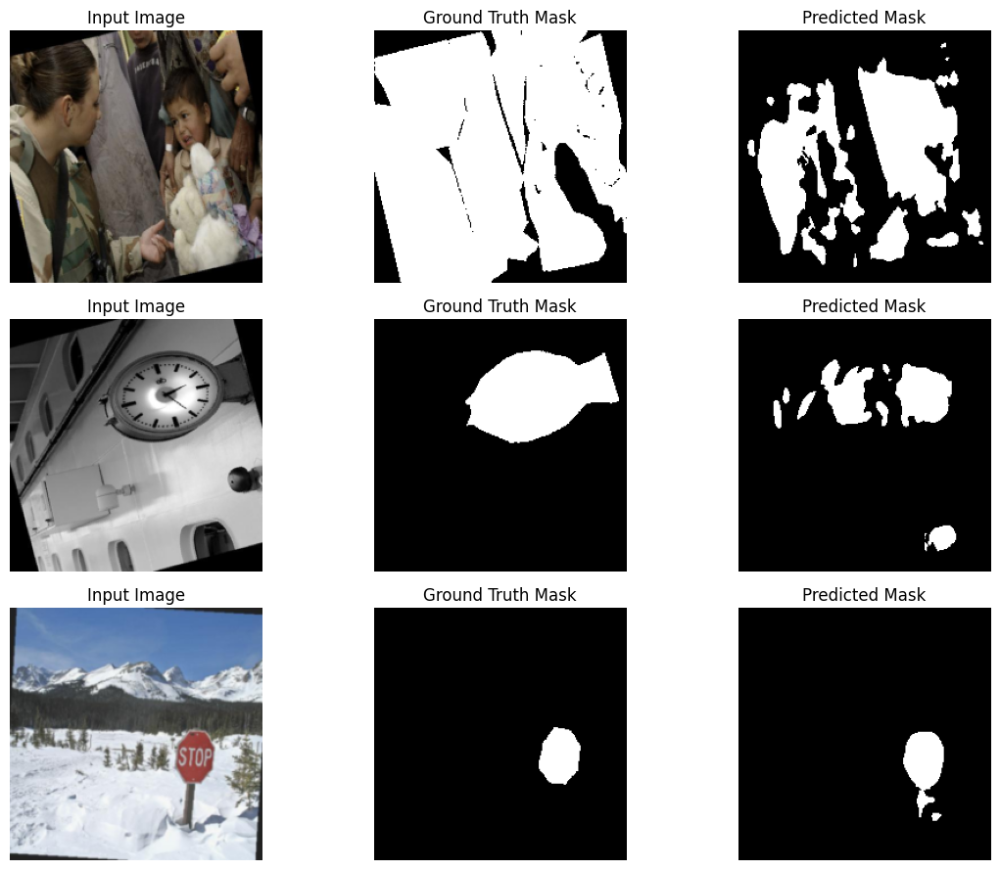

Epoch 25, Batch 0/100
Epoch 25, Batch 10/100
Epoch 25, Batch 20/100
Epoch 25, Batch 30/100
Epoch 25, Batch 40/100
Epoch 25, Batch 50/100
Epoch 25, Batch 60/100
Epoch 25, Batch 70/100
Epoch 25, Batch 80/100
Epoch 25, Batch 90/100
Epoch 25/30, Train Loss: 0.4675, Val Loss: 0.4600, Val IoU: 0.2926
Epoch 26, Batch 0/100
Epoch 26, Batch 10/100
Epoch 26, Batch 20/100
Epoch 26, Batch 30/100
Epoch 26, Batch 40/100
Epoch 26, Batch 50/100
Epoch 26, Batch 60/100
Epoch 26, Batch 70/100
Epoch 26, Batch 80/100
Epoch 26, Batch 90/100
Epoch 26/30, Train Loss: 0.4490, Val Loss: 0.4709, Val IoU: 0.3521
Visualizing predictions after epoch 26


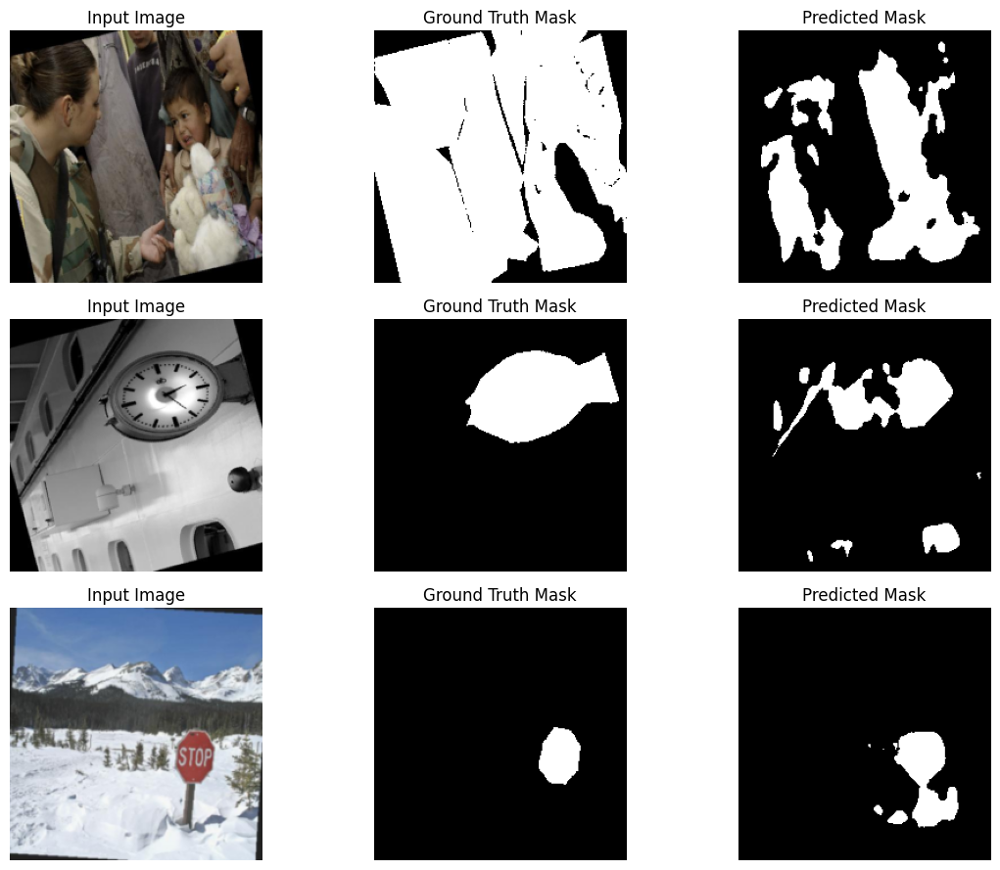

Epoch 27, Batch 0/100
Epoch 27, Batch 10/100
Epoch 27, Batch 20/100
Epoch 27, Batch 30/100
Epoch 27, Batch 40/100
Epoch 27, Batch 50/100
Epoch 27, Batch 60/100
Epoch 27, Batch 70/100
Epoch 27, Batch 80/100
Epoch 27, Batch 90/100
Epoch 27/30, Train Loss: 0.4509, Val Loss: 0.4728, Val IoU: 0.3396
Epoch 28, Batch 0/100
Epoch 28, Batch 10/100
Epoch 28, Batch 20/100
Epoch 28, Batch 30/100
Epoch 28, Batch 40/100
Epoch 28, Batch 50/100
Epoch 28, Batch 60/100
Epoch 28, Batch 70/100
Epoch 28, Batch 80/100
Epoch 28, Batch 90/100
Epoch 28/30, Train Loss: 0.4542, Val Loss: 0.4639, Val IoU: 0.3666
Visualizing predictions after epoch 28


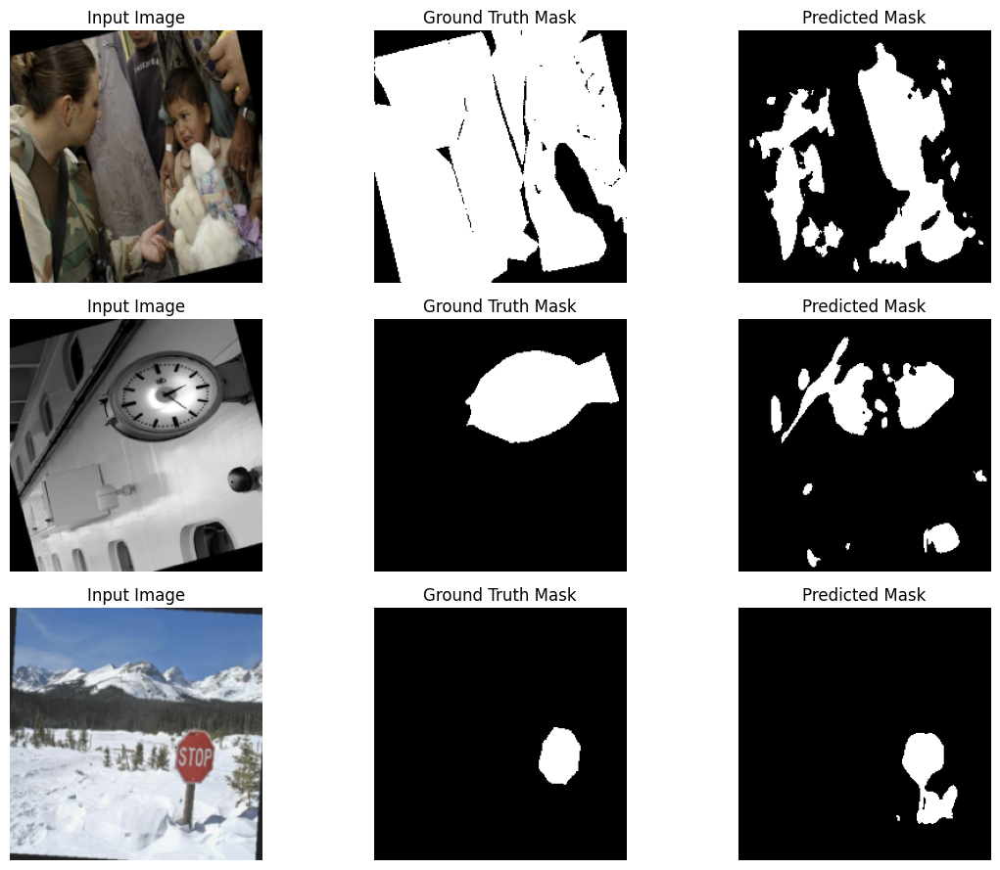

Epoch 29, Batch 0/100
Epoch 29, Batch 10/100
Epoch 29, Batch 20/100
Epoch 29, Batch 30/100
Epoch 29, Batch 40/100
Epoch 29, Batch 50/100
Epoch 29, Batch 60/100
Epoch 29, Batch 70/100
Epoch 29, Batch 80/100
Epoch 29, Batch 90/100
Epoch 29/30, Train Loss: 0.4428, Val Loss: 0.4663, Val IoU: 0.3830
Epoch 30, Batch 0/100
Epoch 30, Batch 10/100
Epoch 30, Batch 20/100
Epoch 30, Batch 30/100
Epoch 30, Batch 40/100
Epoch 30, Batch 50/100
Epoch 30, Batch 60/100
Epoch 30, Batch 70/100
Epoch 30, Batch 80/100
Epoch 30, Batch 90/100
Epoch 30/30, Train Loss: 0.4393, Val Loss: 0.4673, Val IoU: 0.3201
Visualizing predictions after epoch 30


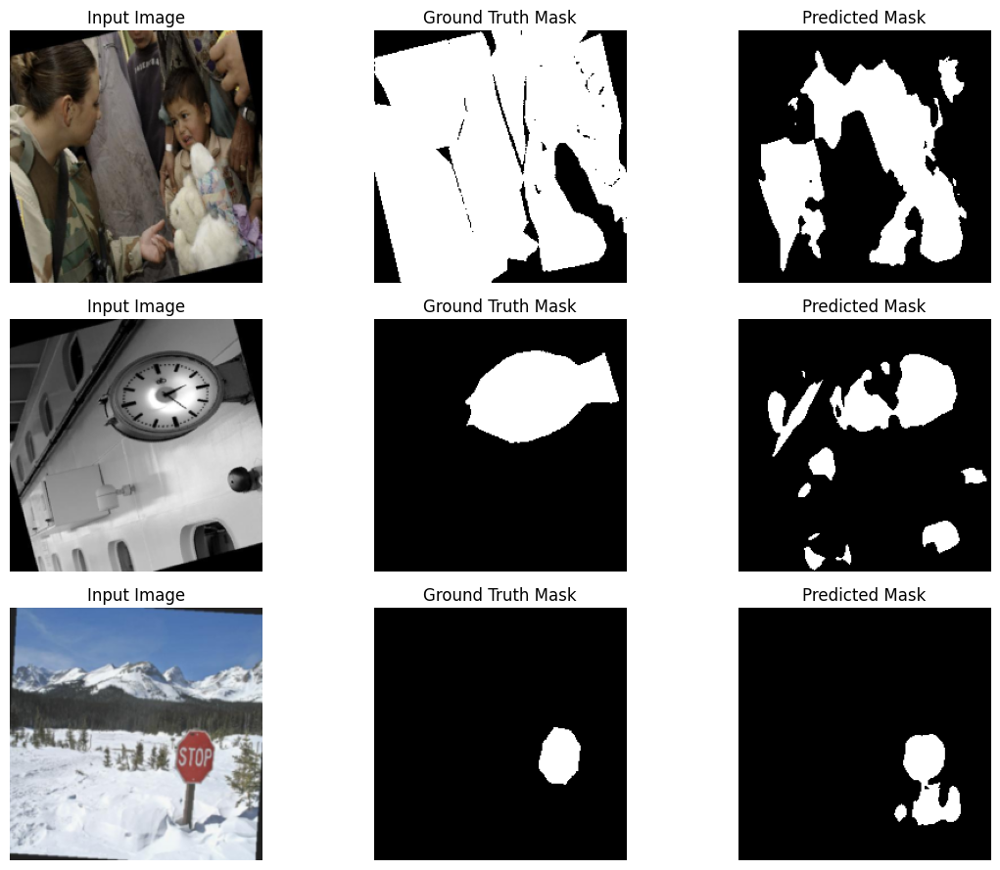

In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 10  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 44
Epoch 45, Batch 0/200
Epoch 45, Batch 10/200
Epoch 45, Batch 20/200
Epoch 45, Batch 30/200
Epoch 45, Batch 40/200
Epoch 45, Batch 50/200
Epoch 45, Batch 60/200
Epoch 45, Batch 70/200
Epoch 45, Batch 80/200
Epoch 45, Batch 90/200
Epoch 45, Batch 100/200
Epoch 45, Batch 110/200
Epoch 45, Batch 120/200
Epoch 45, Batch 130/200
Epoch 45, Batch 140/200
Epoch 45, Batch 150/200
Epoch 45, Batch 160/200
Epoch 45, Batch 170/200
Epoch 45, Batch 180/200
Epoch 45, Batch 190/200
Epoch 45/52, Train Loss: 0.4216, Val Loss: 0.4437, Val IoU: 0.4078
Epoch 46, Batch 0/200
Epoch 46, Batch 10/200
Epoch 46, Batch 20/200
Epoch 46, Batch 30/200
Epoch 46, Batch 40/200
Epoch 46, Batch 50/200
Epoch 46, Batch 60/200
Epoch 46, Batch 70/200
Epoch 46, Batch 80/200
Epoch 46, Batch 90/200
Epoch 46, Batch 100/200
Epoch 46, Batch 110/200
Epoch 46, Batch 120/200
Epoch 46, Batch 130/200
Epoch 46, Batch 140/200
Epoch 46, Batch 150/200
Epoch 46, Batch 160/200
Epoch 46, Batch 170/200
Epoch 46, Batch 180/

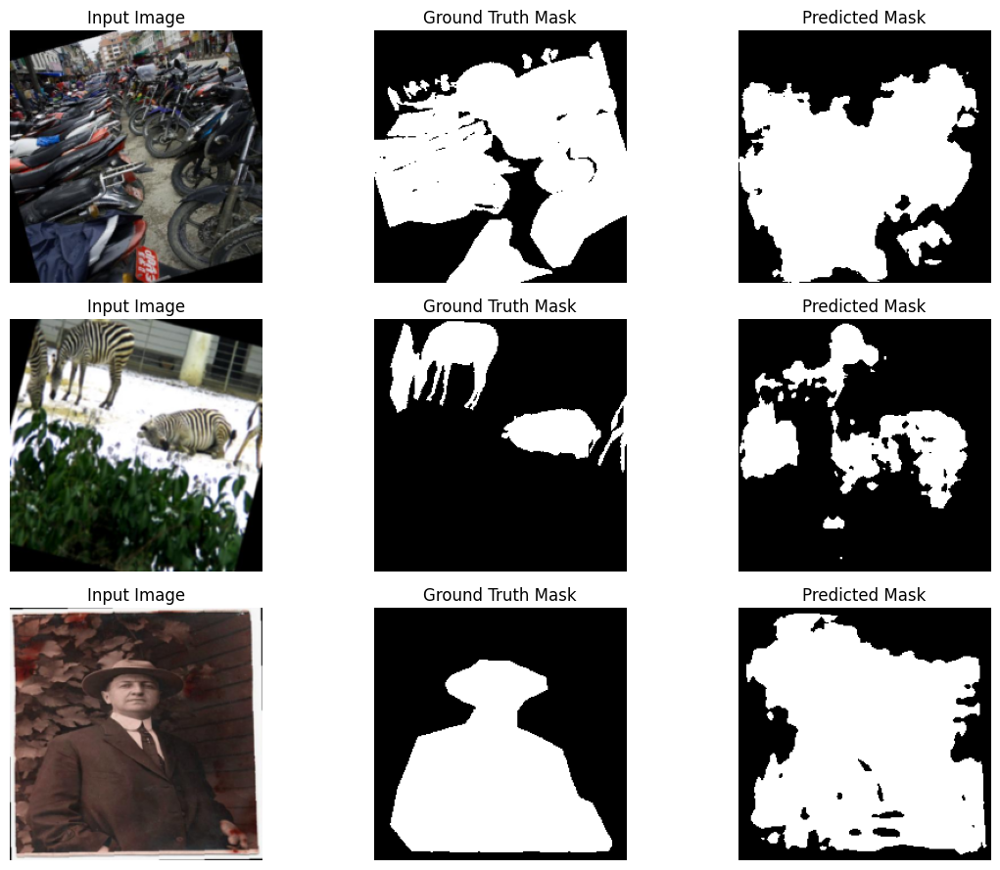

Epoch 47, Batch 0/200
Epoch 47, Batch 10/200
Epoch 47, Batch 20/200
Epoch 47, Batch 30/200
Epoch 47, Batch 40/200
Epoch 47, Batch 50/200
Epoch 47, Batch 60/200
Epoch 47, Batch 70/200
Epoch 47, Batch 80/200
Epoch 47, Batch 90/200
Epoch 47, Batch 100/200
Epoch 47, Batch 110/200
Epoch 47, Batch 120/200
Epoch 47, Batch 130/200
Epoch 47, Batch 140/200
Epoch 47, Batch 150/200
Epoch 47, Batch 160/200
Epoch 47, Batch 170/200
Epoch 47, Batch 180/200
Epoch 47, Batch 190/200
Epoch 47/52, Train Loss: 0.4095, Val Loss: 0.4433, Val IoU: 0.3374
Epoch 48, Batch 0/200
Epoch 48, Batch 10/200
Epoch 48, Batch 20/200
Epoch 48, Batch 30/200
Epoch 48, Batch 40/200
Epoch 48, Batch 50/200
Epoch 48, Batch 60/200
Epoch 48, Batch 70/200
Epoch 48, Batch 80/200
Epoch 48, Batch 90/200
Epoch 48, Batch 100/200
Epoch 48, Batch 110/200
Epoch 48, Batch 120/200
Epoch 48, Batch 130/200
Epoch 48, Batch 140/200
Epoch 48, Batch 150/200
Epoch 48, Batch 160/200
Epoch 48, Batch 170/200
Epoch 48, Batch 180/200
Epoch 48, Batch 190

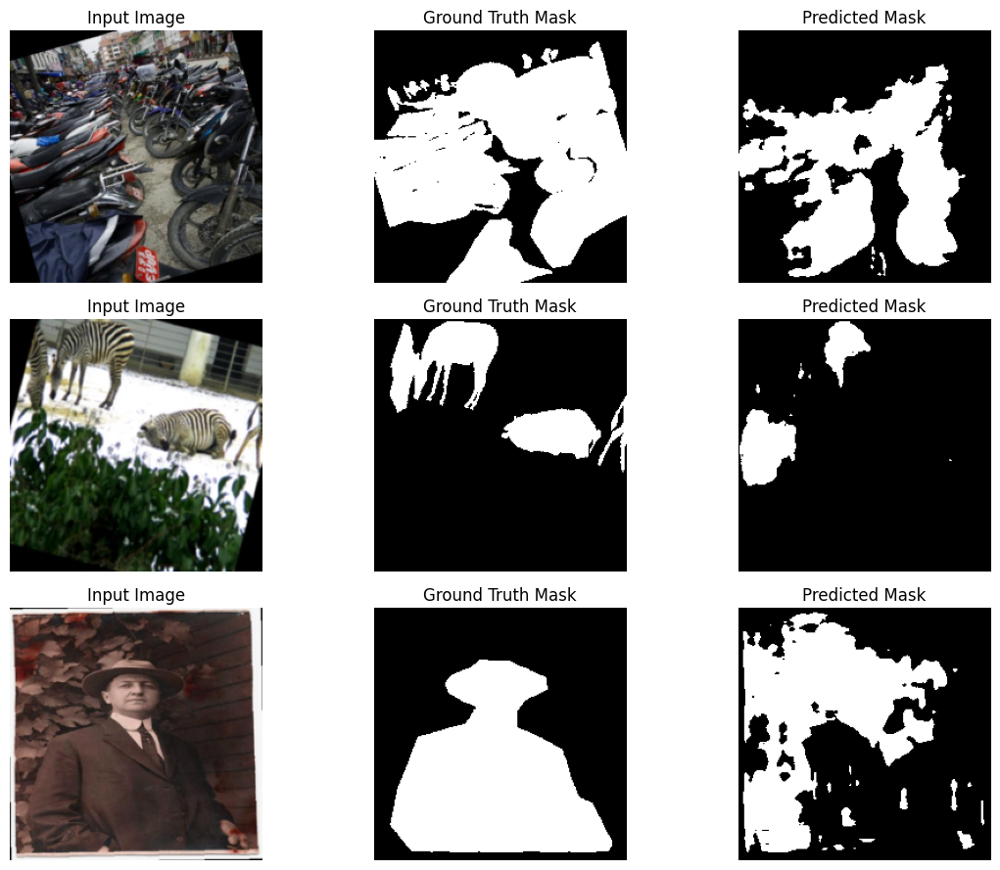

Epoch 49, Batch 0/200
Epoch 49, Batch 10/200
Epoch 49, Batch 20/200


In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 8  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 38
Epoch 39, Batch 0/200
Epoch 39, Batch 10/200
Epoch 39, Batch 20/200
Epoch 39, Batch 30/200
Epoch 39, Batch 40/200
Epoch 39, Batch 50/200
Epoch 39, Batch 60/200
Epoch 39, Batch 70/200
Epoch 39, Batch 80/200
Epoch 39, Batch 90/200
Epoch 39, Batch 100/200
Epoch 39, Batch 110/200
Epoch 39, Batch 120/200
Epoch 39, Batch 130/200
Epoch 39, Batch 140/200
Epoch 39, Batch 150/200
Epoch 39, Batch 160/200
Epoch 39, Batch 170/200
Epoch 39, Batch 180/200
Epoch 39, Batch 190/200
Epoch 39/44, Train Loss: 0.4638, Val Loss: 0.4418, Val IoU: 0.4645
Epoch 40, Batch 0/200
Epoch 40, Batch 10/200
Epoch 40, Batch 20/200
Epoch 40, Batch 30/200
Epoch 40, Batch 40/200
Epoch 40, Batch 50/200
Epoch 40, Batch 60/200
Epoch 40, Batch 70/200
Epoch 40, Batch 80/200
Epoch 40, Batch 90/200
Epoch 40, Batch 100/200
Epoch 40, Batch 110/200
Epoch 40, Batch 120/200
Epoch 40, Batch 130/200
Epoch 40, Batch 140/200
Epoch 40, Batch 150/200
Epoch 40, Batch 160/200
Epoch 40, Batch 170/200
Epoch 40, Batch 180/

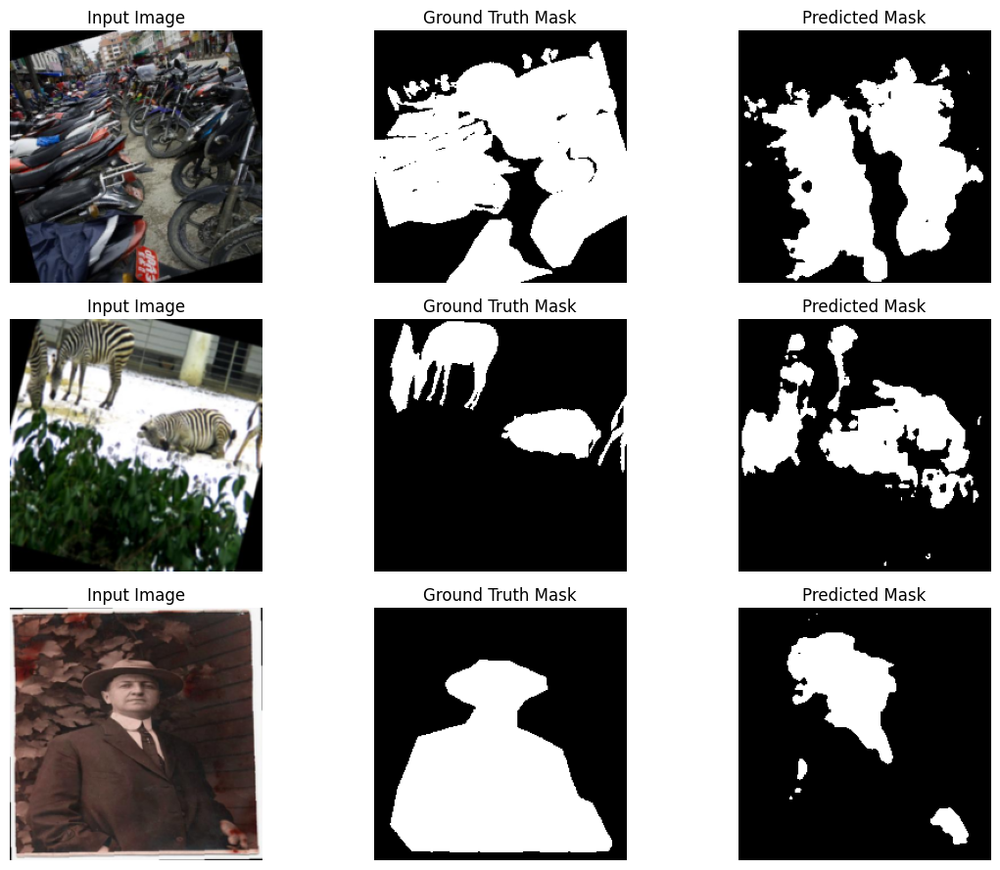

Epoch 41, Batch 0/200
Epoch 41, Batch 10/200
Epoch 41, Batch 20/200
Epoch 41, Batch 30/200
Epoch 41, Batch 40/200
Epoch 41, Batch 50/200
Epoch 41, Batch 60/200
Epoch 41, Batch 70/200
Epoch 41, Batch 80/200
Epoch 41, Batch 90/200
Epoch 41, Batch 100/200
Epoch 41, Batch 110/200
Epoch 41, Batch 120/200
Epoch 41, Batch 130/200
Epoch 41, Batch 140/200
Epoch 41, Batch 150/200
Epoch 41, Batch 160/200
Epoch 41, Batch 170/200
Epoch 41, Batch 180/200
Epoch 41, Batch 190/200
Epoch 41/44, Train Loss: 0.4425, Val Loss: 0.4407, Val IoU: 0.3611
Epoch 42, Batch 0/200
Epoch 42, Batch 10/200
Epoch 42, Batch 20/200
Epoch 42, Batch 30/200
Epoch 42, Batch 40/200
Epoch 42, Batch 50/200
Epoch 42, Batch 60/200
Epoch 42, Batch 70/200
Epoch 42, Batch 80/200
Epoch 42, Batch 90/200
Epoch 42, Batch 100/200
Epoch 42, Batch 110/200
Epoch 42, Batch 120/200
Epoch 42, Batch 130/200
Epoch 42, Batch 140/200
Epoch 42, Batch 150/200
Epoch 42, Batch 160/200
Epoch 42, Batch 170/200
Epoch 42, Batch 180/200
Epoch 42, Batch 190

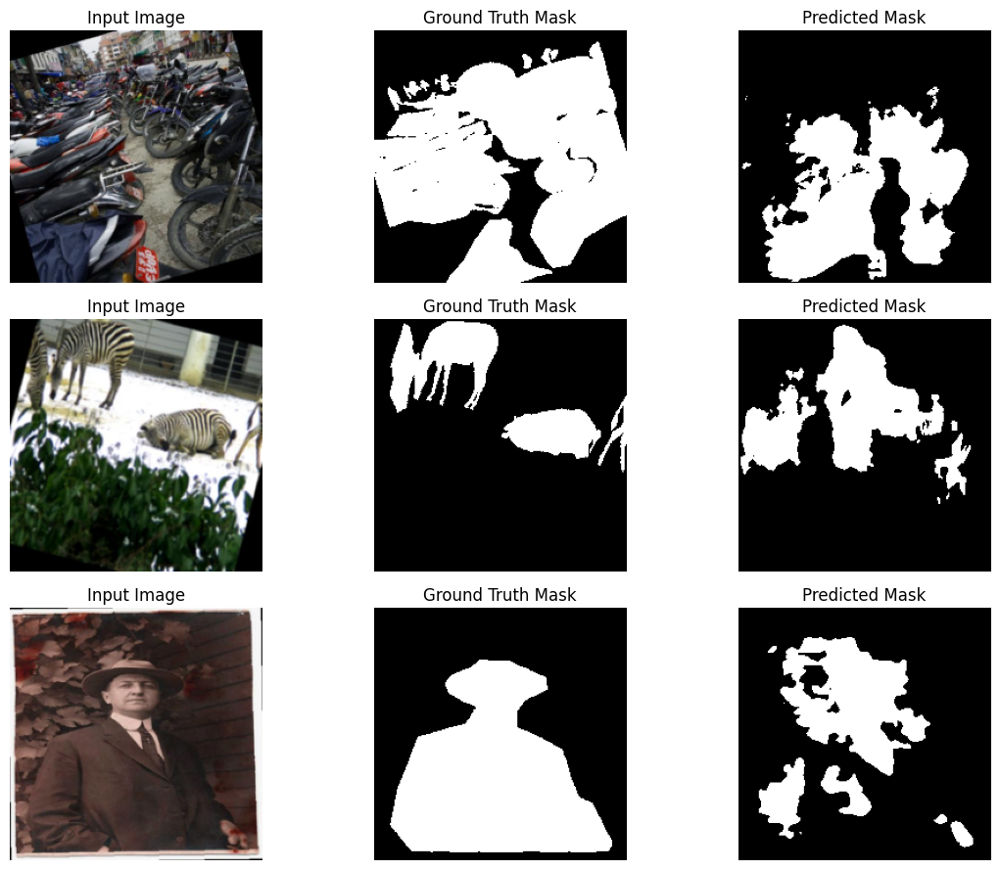

Epoch 43, Batch 0/200
Epoch 43, Batch 10/200
Epoch 43, Batch 20/200
Epoch 43, Batch 30/200
Epoch 43, Batch 40/200
Epoch 43, Batch 50/200
Epoch 43, Batch 60/200
Epoch 43, Batch 70/200
Epoch 43, Batch 80/200
Epoch 43, Batch 90/200
Epoch 43, Batch 100/200
Epoch 43, Batch 110/200
Epoch 43, Batch 120/200
Epoch 43, Batch 130/200
Epoch 43, Batch 140/200
Epoch 43, Batch 150/200
Epoch 43, Batch 160/200
Epoch 43, Batch 170/200
Epoch 43, Batch 180/200
Epoch 43, Batch 190/200
Epoch 43/44, Train Loss: 0.4342, Val Loss: 0.4439, Val IoU: 0.4522
Epoch 44, Batch 0/200
Epoch 44, Batch 10/200
Epoch 44, Batch 20/200
Epoch 44, Batch 30/200
Epoch 44, Batch 40/200
Epoch 44, Batch 50/200
Epoch 44, Batch 60/200
Epoch 44, Batch 70/200
Epoch 44, Batch 80/200
Epoch 44, Batch 90/200
Epoch 44, Batch 100/200
Epoch 44, Batch 110/200
Epoch 44, Batch 120/200
Epoch 44, Batch 130/200
Epoch 44, Batch 140/200
Epoch 44, Batch 150/200
Epoch 44, Batch 160/200
Epoch 44, Batch 170/200
Epoch 44, Batch 180/200
Epoch 44, Batch 190

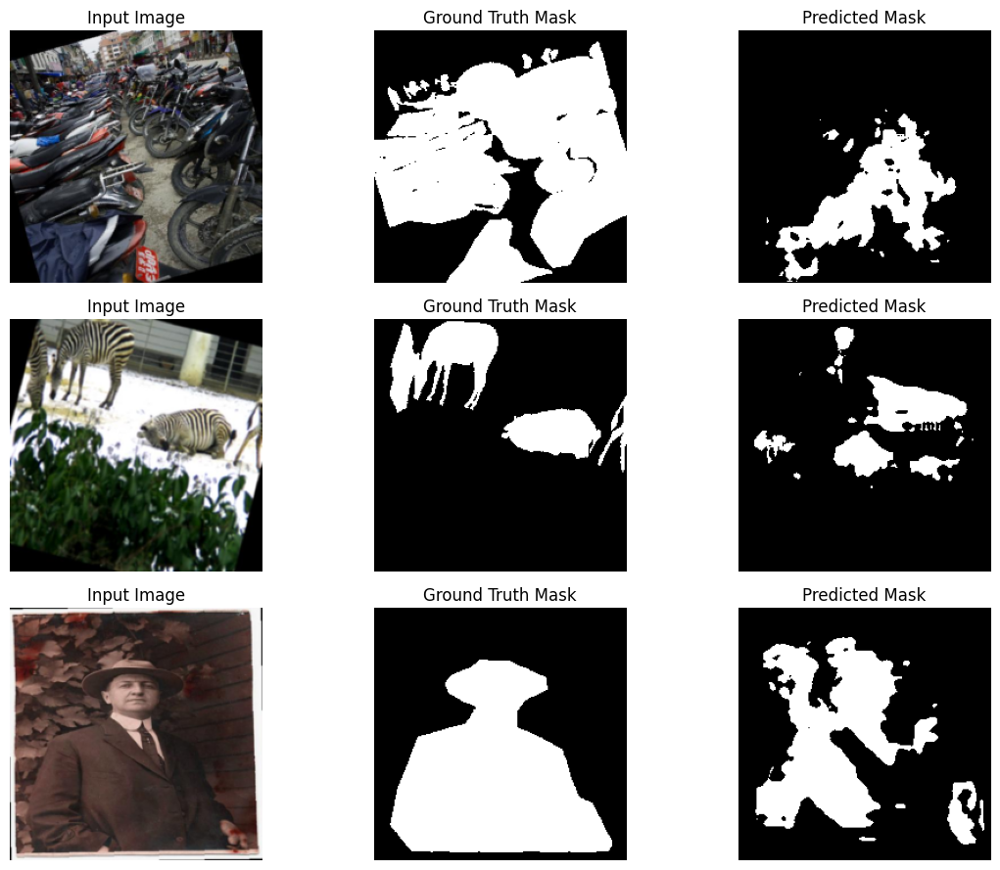

In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 6  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 50
Epoch 51, Batch 0/200
Epoch 51, Batch 10/200
Epoch 51, Batch 20/200
Epoch 51, Batch 30/200
Epoch 51, Batch 40/200
Epoch 51, Batch 50/200
Epoch 51, Batch 60/200
Epoch 51, Batch 70/200
Epoch 51, Batch 80/200
Epoch 51, Batch 90/200
Epoch 51, Batch 100/200
Epoch 51, Batch 110/200
Epoch 51, Batch 120/200
Epoch 51, Batch 130/200
Epoch 51, Batch 140/200
Epoch 51, Batch 150/200
Epoch 51, Batch 160/200
Epoch 51, Batch 170/200
Epoch 51, Batch 180/200
Epoch 51, Batch 190/200
Epoch 51/60, Train Loss: 0.4353, Val Loss: 0.4334, Val IoU: 0.4252
Epoch 52, Batch 0/200
Epoch 52, Batch 10/200
Epoch 52, Batch 20/200
Epoch 52, Batch 30/200
Epoch 52, Batch 40/200
Epoch 52, Batch 50/200
Epoch 52, Batch 60/200
Epoch 52, Batch 70/200
Epoch 52, Batch 80/200
Epoch 52, Batch 90/200
Epoch 52, Batch 100/200
Epoch 52, Batch 110/200
Epoch 52, Batch 120/200
Epoch 52, Batch 130/200
Epoch 52, Batch 140/200
Epoch 52, Batch 150/200
Epoch 52, Batch 160/200
Epoch 52, Batch 170/200
Epoch 52, Batch 180/

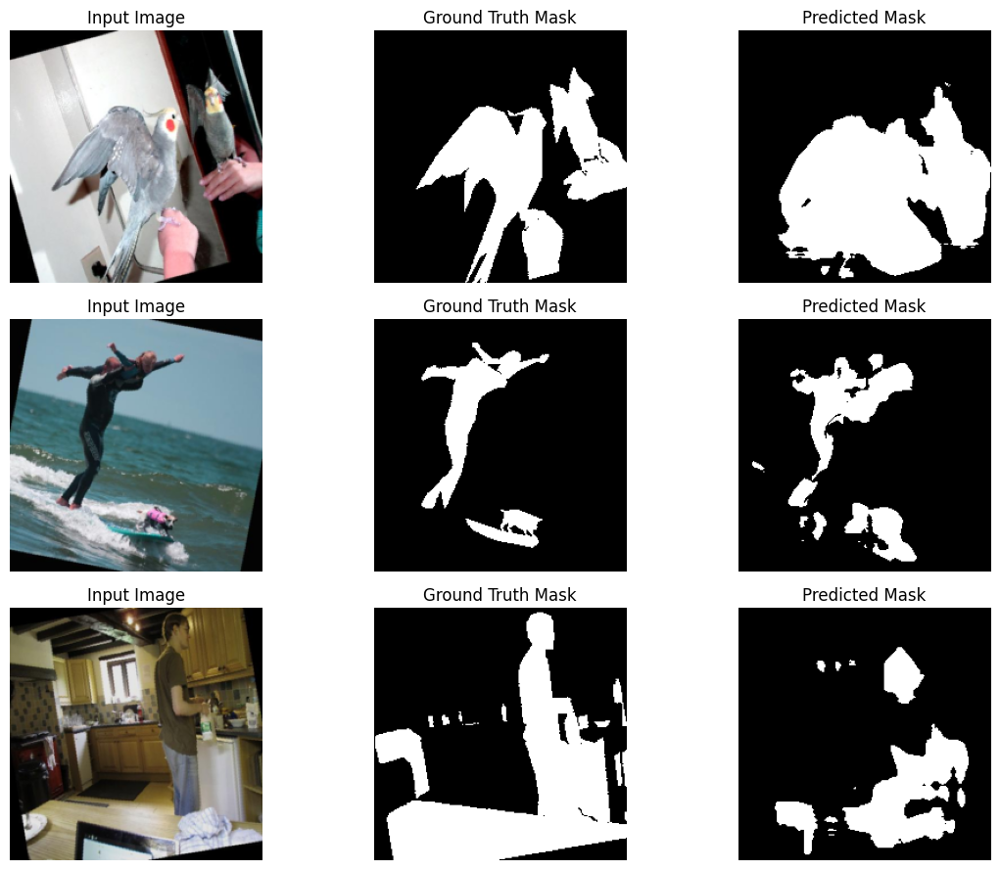

Epoch 53, Batch 0/200
Epoch 53, Batch 10/200
Epoch 53, Batch 20/200
Epoch 53, Batch 30/200
Epoch 53, Batch 40/200
Epoch 53, Batch 50/200
Epoch 53, Batch 60/200
Epoch 53, Batch 70/200
Epoch 53, Batch 80/200
Epoch 53, Batch 90/200
Epoch 53, Batch 100/200
Epoch 53, Batch 110/200
Epoch 53, Batch 120/200
Epoch 53, Batch 130/200
Epoch 53, Batch 140/200
Epoch 53, Batch 150/200
Epoch 53, Batch 160/200
Epoch 53, Batch 170/200
Epoch 53, Batch 180/200
Epoch 53, Batch 190/200
Epoch 53/60, Train Loss: 0.4208, Val Loss: 0.4244, Val IoU: 0.4646
Epoch 54, Batch 0/200
Epoch 54, Batch 10/200
Epoch 54, Batch 20/200
Epoch 54, Batch 30/200
Epoch 54, Batch 40/200
Epoch 54, Batch 50/200
Epoch 54, Batch 60/200
Epoch 54, Batch 70/200
Epoch 54, Batch 80/200
Epoch 54, Batch 90/200
Epoch 54, Batch 100/200
Epoch 54, Batch 110/200
Epoch 54, Batch 120/200
Epoch 54, Batch 130/200
Epoch 54, Batch 140/200
Epoch 54, Batch 150/200
Epoch 54, Batch 160/200
Epoch 54, Batch 170/200
Epoch 54, Batch 180/200
Epoch 54, Batch 190

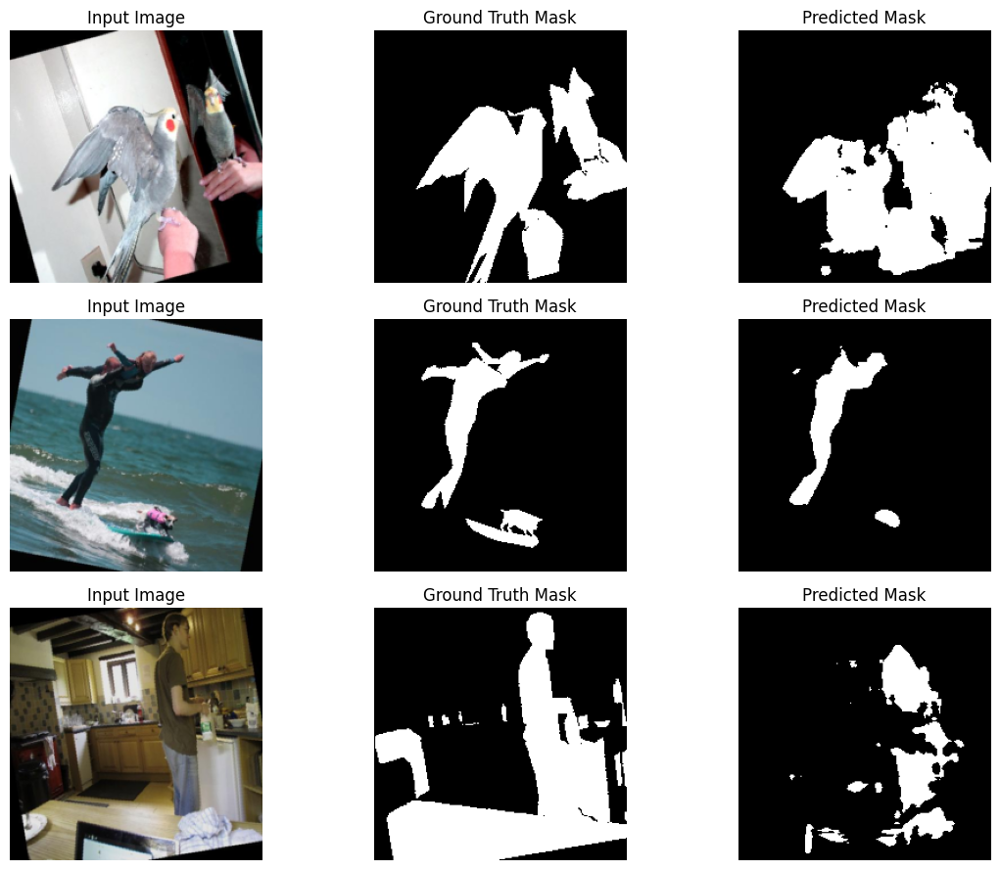

Epoch 55, Batch 0/200
Epoch 55, Batch 10/200
Epoch 55, Batch 20/200
Epoch 55, Batch 30/200
Epoch 55, Batch 40/200
Epoch 55, Batch 50/200
Epoch 55, Batch 60/200
Epoch 55, Batch 70/200
Epoch 55, Batch 80/200
Epoch 55, Batch 90/200
Epoch 55, Batch 100/200
Epoch 55, Batch 110/200
Epoch 55, Batch 120/200
Epoch 55, Batch 130/200
Epoch 55, Batch 140/200
Epoch 55, Batch 150/200
Epoch 55, Batch 160/200
Epoch 55, Batch 170/200
Epoch 55, Batch 180/200
Epoch 55, Batch 190/200
Epoch 55/60, Train Loss: 0.4044, Val Loss: 0.4260, Val IoU: 0.4209
Epoch 56, Batch 0/200
Epoch 56, Batch 10/200
Epoch 56, Batch 20/200
Epoch 56, Batch 30/200
Epoch 56, Batch 40/200
Epoch 56, Batch 50/200
Epoch 56, Batch 60/200
Epoch 56, Batch 70/200
Epoch 56, Batch 80/200
Epoch 56, Batch 90/200
Epoch 56, Batch 100/200
Epoch 56, Batch 110/200
Epoch 56, Batch 120/200
Epoch 56, Batch 130/200
Epoch 56, Batch 140/200
Epoch 56, Batch 150/200
Epoch 56, Batch 160/200
Epoch 56, Batch 170/200
Epoch 56, Batch 180/200
Epoch 56, Batch 190

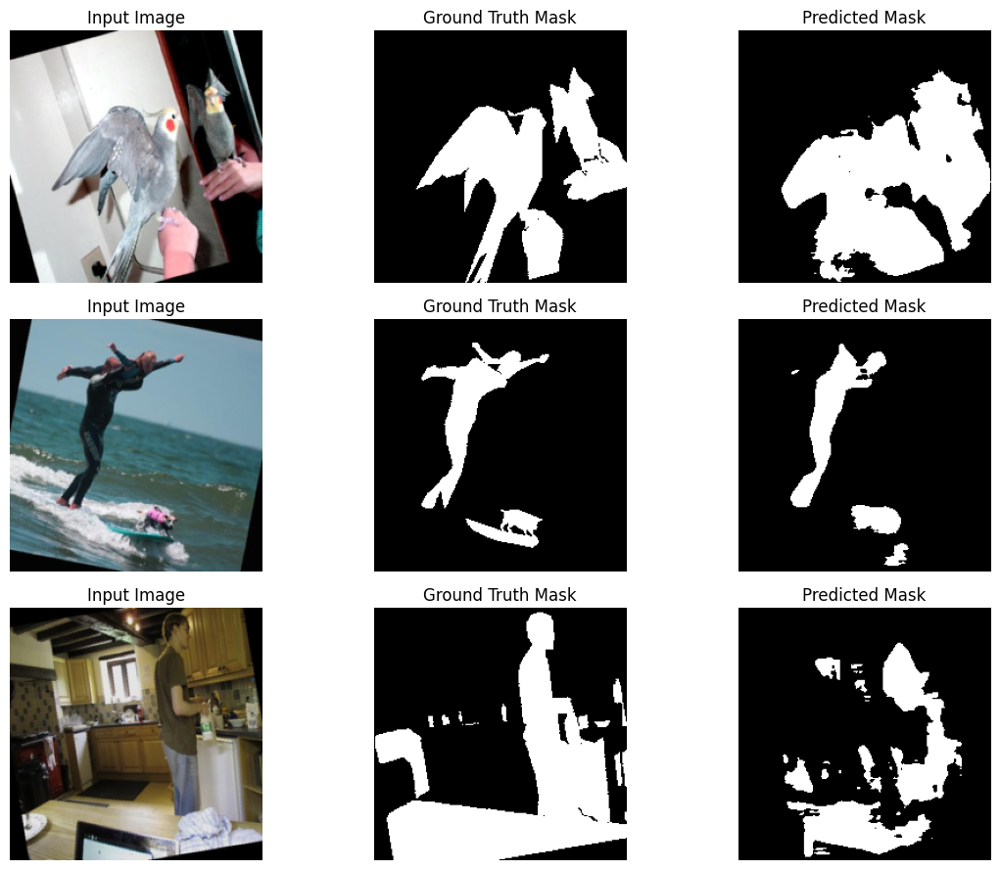

Epoch 57, Batch 0/200
Epoch 57, Batch 10/200
Epoch 57, Batch 20/200
Epoch 57, Batch 30/200
Epoch 57, Batch 40/200
Epoch 57, Batch 50/200
Epoch 57, Batch 60/200
Epoch 57, Batch 70/200
Epoch 57, Batch 80/200
Epoch 57, Batch 90/200
Epoch 57, Batch 100/200
Epoch 57, Batch 110/200
Epoch 57, Batch 120/200
Epoch 57, Batch 130/200
Epoch 57, Batch 140/200
Epoch 57, Batch 150/200
Epoch 57, Batch 160/200
Epoch 57, Batch 170/200
Epoch 57, Batch 180/200
Epoch 57, Batch 190/200
Epoch 57/60, Train Loss: 0.3905, Val Loss: 0.4316, Val IoU: 0.4405
Epoch 58, Batch 0/200
Epoch 58, Batch 10/200
Epoch 58, Batch 20/200
Epoch 58, Batch 30/200
Epoch 58, Batch 40/200
Epoch 58, Batch 50/200
Epoch 58, Batch 60/200
Epoch 58, Batch 70/200
Epoch 58, Batch 80/200
Epoch 58, Batch 90/200
Epoch 58, Batch 100/200
Epoch 58, Batch 110/200
Epoch 58, Batch 120/200
Epoch 58, Batch 130/200
Epoch 58, Batch 140/200
Epoch 58, Batch 150/200
Epoch 58, Batch 160/200
Epoch 58, Batch 170/200
Epoch 58, Batch 180/200
Epoch 58, Batch 190

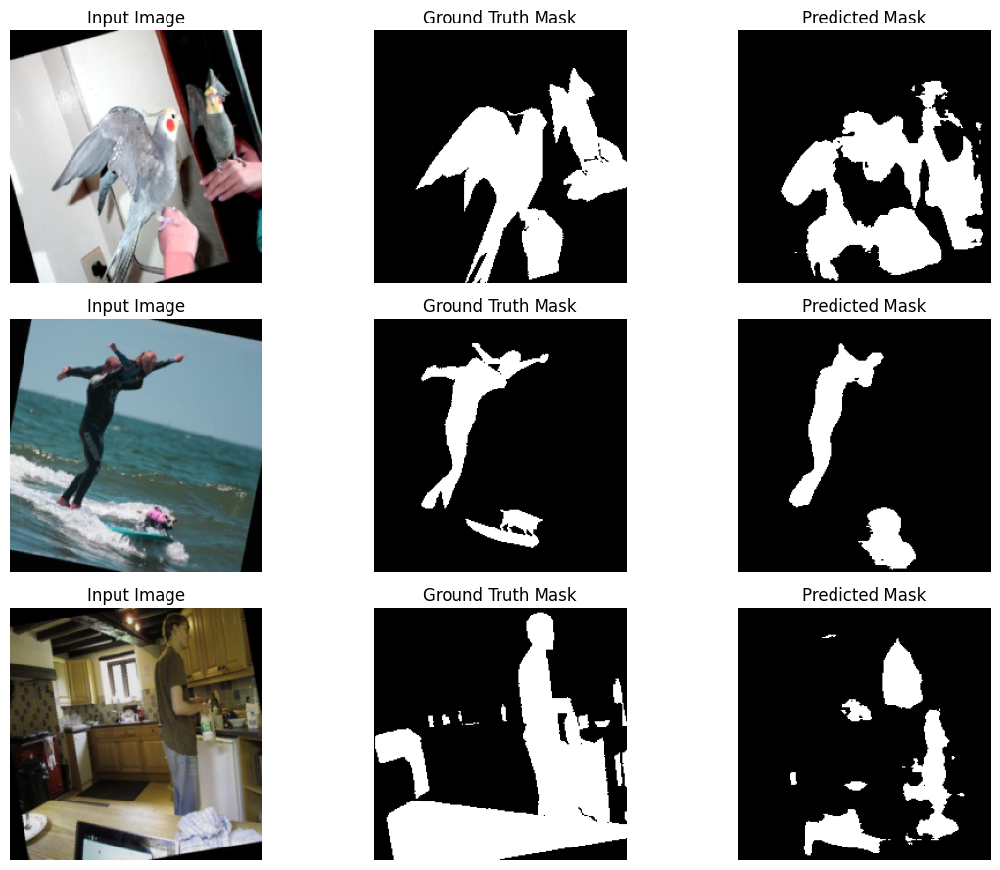

Epoch 59, Batch 0/200
Epoch 59, Batch 10/200
Epoch 59, Batch 20/200
Epoch 59, Batch 30/200
Epoch 59, Batch 40/200
Epoch 59, Batch 50/200
Epoch 59, Batch 60/200
Epoch 59, Batch 70/200
Epoch 59, Batch 80/200
Epoch 59, Batch 90/200
Epoch 59, Batch 100/200
Epoch 59, Batch 110/200
Epoch 59, Batch 120/200
Epoch 59, Batch 130/200
Epoch 59, Batch 140/200
Epoch 59, Batch 150/200
Epoch 59, Batch 160/200
Epoch 59, Batch 170/200
Epoch 59, Batch 180/200
Epoch 59, Batch 190/200
Epoch 59/60, Train Loss: 0.3773, Val Loss: 0.4420, Val IoU: 0.3931
Epoch 60, Batch 0/200
Epoch 60, Batch 10/200
Epoch 60, Batch 20/200
Epoch 60, Batch 30/200
Epoch 60, Batch 40/200
Epoch 60, Batch 50/200
Epoch 60, Batch 60/200
Epoch 60, Batch 70/200
Epoch 60, Batch 80/200
Epoch 60, Batch 90/200
Epoch 60, Batch 100/200
Epoch 60, Batch 110/200
Epoch 60, Batch 120/200
Epoch 60, Batch 130/200
Epoch 60, Batch 140/200
Epoch 60, Batch 150/200
Epoch 60, Batch 160/200
Epoch 60, Batch 170/200
Epoch 60, Batch 180/200
Epoch 60, Batch 190

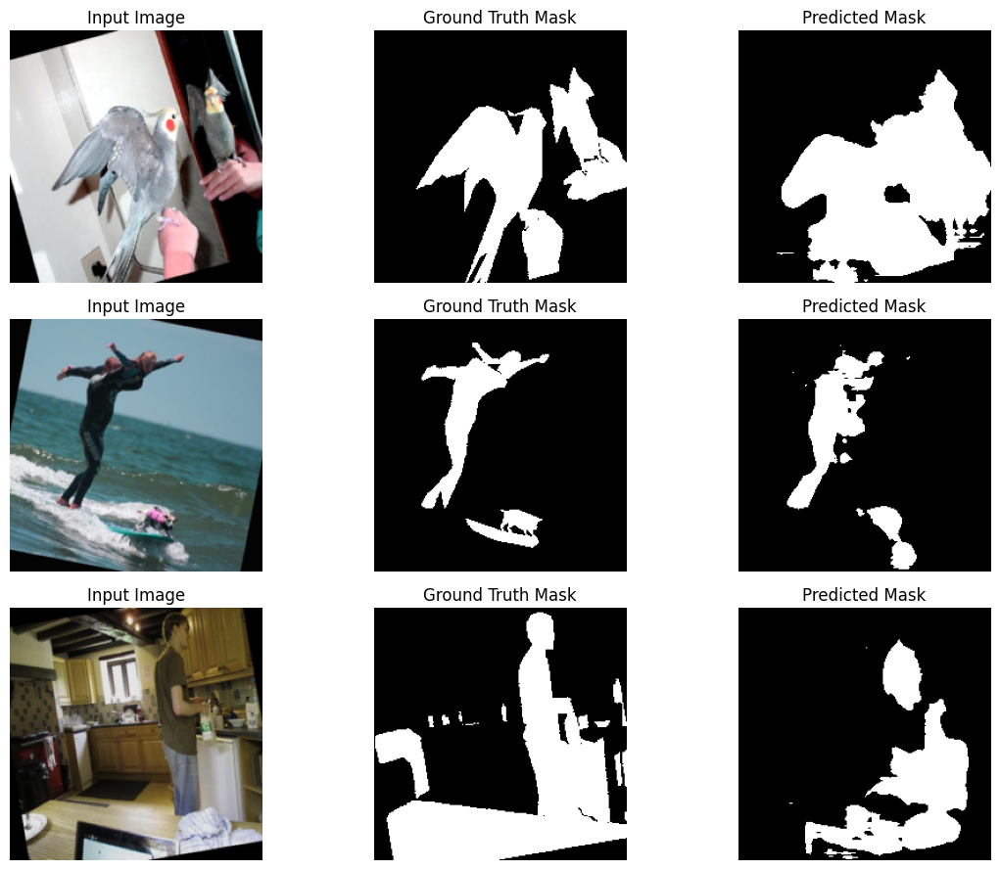

In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 10  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 60
Epoch 61, Batch 0/200
Epoch 61, Batch 10/200
Epoch 61, Batch 20/200
Epoch 61, Batch 30/200
Epoch 61, Batch 40/200
Epoch 61, Batch 50/200
Epoch 61, Batch 60/200
Epoch 61, Batch 70/200
Epoch 61, Batch 80/200
Epoch 61, Batch 90/200
Epoch 61, Batch 100/200
Epoch 61, Batch 110/200
Epoch 61, Batch 120/200
Epoch 61, Batch 130/200
Epoch 61, Batch 140/200
Epoch 61, Batch 150/200
Epoch 61, Batch 160/200
Epoch 61, Batch 170/200
Epoch 61, Batch 180/200
Epoch 61, Batch 190/200
Epoch 61/68, Train Loss: 0.4350, Val Loss: 0.4290, Val IoU: 0.3936
Epoch 62, Batch 0/200
Epoch 62, Batch 10/200
Epoch 62, Batch 20/200
Epoch 62, Batch 30/200
Epoch 62, Batch 40/200
Epoch 62, Batch 50/200
Epoch 62, Batch 60/200
Epoch 62, Batch 70/200
Epoch 62, Batch 80/200
Epoch 62, Batch 90/200
Epoch 62, Batch 100/200
Epoch 62, Batch 110/200
Epoch 62, Batch 120/200
Epoch 62, Batch 130/200
Epoch 62, Batch 140/200
Epoch 62, Batch 150/200
Epoch 62, Batch 160/200
Epoch 62, Batch 170/200
Epoch 62, Batch 180/

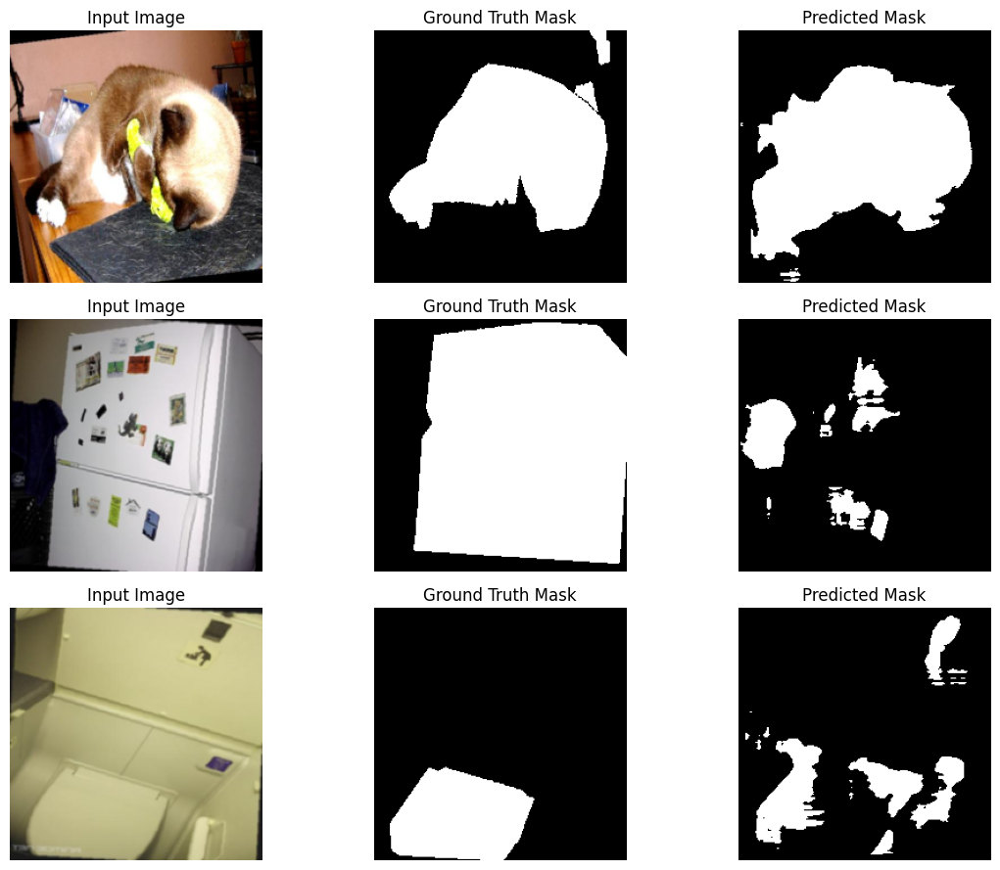

Epoch 63, Batch 0/200
Epoch 63, Batch 10/200
Epoch 63, Batch 20/200
Epoch 63, Batch 30/200
Epoch 63, Batch 40/200
Epoch 63, Batch 50/200
Epoch 63, Batch 60/200
Epoch 63, Batch 70/200
Epoch 63, Batch 80/200
Epoch 63, Batch 90/200
Epoch 63, Batch 100/200
Epoch 63, Batch 110/200
Epoch 63, Batch 120/200
Epoch 63, Batch 130/200
Epoch 63, Batch 140/200
Epoch 63, Batch 150/200
Epoch 63, Batch 160/200
Epoch 63, Batch 170/200
Epoch 63, Batch 180/200
Epoch 63, Batch 190/200
Epoch 63/68, Train Loss: 0.4099, Val Loss: 0.4321, Val IoU: 0.4491
Epoch 64, Batch 0/200
Epoch 64, Batch 10/200
Epoch 64, Batch 20/200
Epoch 64, Batch 30/200
Epoch 64, Batch 40/200
Epoch 64, Batch 50/200
Epoch 64, Batch 60/200
Epoch 64, Batch 70/200
Epoch 64, Batch 80/200
Epoch 64, Batch 90/200
Epoch 64, Batch 100/200
Epoch 64, Batch 110/200
Epoch 64, Batch 120/200
Epoch 64, Batch 130/200
Epoch 64, Batch 140/200
Epoch 64, Batch 150/200
Epoch 64, Batch 160/200
Epoch 64, Batch 170/200
Epoch 64, Batch 180/200
Epoch 64, Batch 190

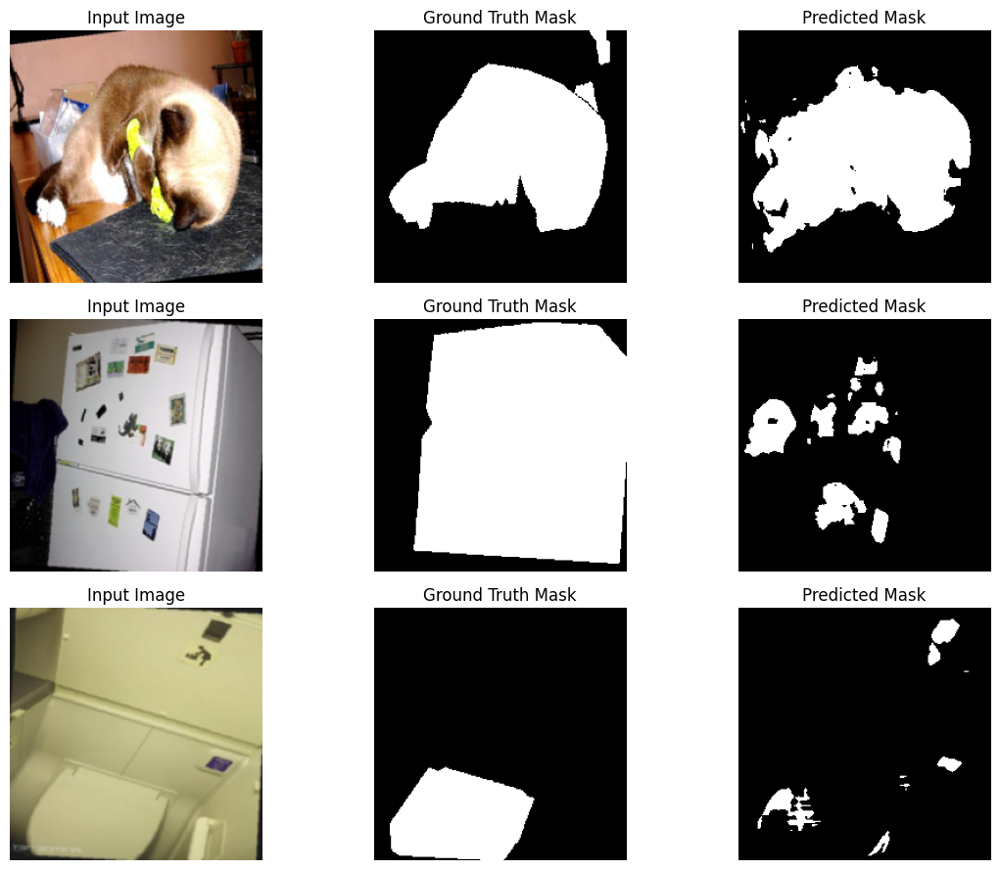

Epoch 65, Batch 0/200
Epoch 65, Batch 10/200
Epoch 65, Batch 20/200
Epoch 65, Batch 30/200
Epoch 65, Batch 40/200
Epoch 65, Batch 50/200
Epoch 65, Batch 60/200
Epoch 65, Batch 70/200
Epoch 65, Batch 80/200
Epoch 65, Batch 90/200
Epoch 65, Batch 100/200
Epoch 65, Batch 110/200
Epoch 65, Batch 120/200
Epoch 65, Batch 130/200
Epoch 65, Batch 140/200
Epoch 65, Batch 150/200
Epoch 65, Batch 160/200
Epoch 65, Batch 170/200
Epoch 65, Batch 180/200
Epoch 65, Batch 190/200
Epoch 65/68, Train Loss: 0.3828, Val Loss: 0.4255, Val IoU: 0.3936
Epoch 66, Batch 0/200
Epoch 66, Batch 10/200
Epoch 66, Batch 20/200
Epoch 66, Batch 30/200
Epoch 66, Batch 40/200
Epoch 66, Batch 50/200
Epoch 66, Batch 60/200
Epoch 66, Batch 70/200
Epoch 66, Batch 80/200
Epoch 66, Batch 90/200
Epoch 66, Batch 100/200
Epoch 66, Batch 110/200
Epoch 66, Batch 120/200
Epoch 66, Batch 130/200
Epoch 66, Batch 140/200
Epoch 66, Batch 150/200
Epoch 66, Batch 160/200
Epoch 66, Batch 170/200
Epoch 66, Batch 180/200
Epoch 66, Batch 190

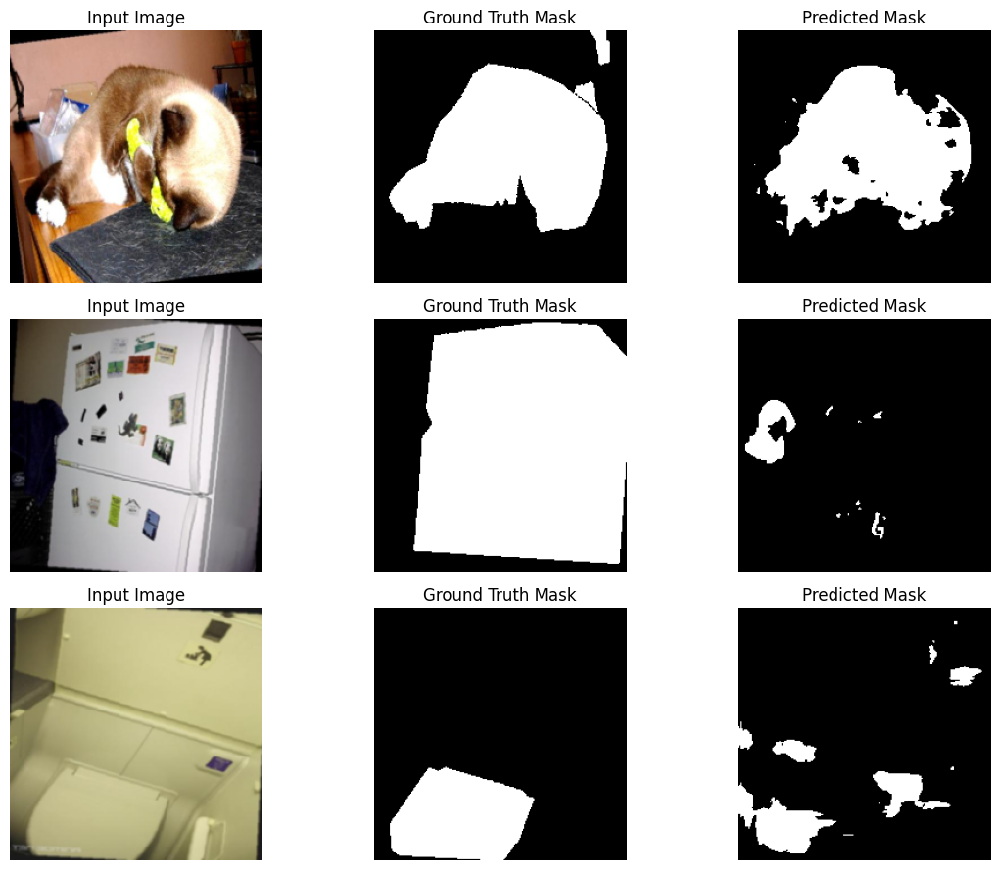

Epoch 67, Batch 0/200
Epoch 67, Batch 10/200


In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 8  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 68
Epoch 69, Batch 0/200
Epoch 69, Batch 10/200
Epoch 69, Batch 20/200
Epoch 69, Batch 30/200
Epoch 69, Batch 40/200
Epoch 69, Batch 50/200
Epoch 69, Batch 60/200
Epoch 69, Batch 70/200
Epoch 69, Batch 80/200
Epoch 69, Batch 90/200
Epoch 69, Batch 100/200
Epoch 69, Batch 110/200
Epoch 69, Batch 120/200
Epoch 69, Batch 130/200
Epoch 69, Batch 140/200
Epoch 69, Batch 150/200
Epoch 69, Batch 160/200
Epoch 69, Batch 170/200
Epoch 69, Batch 180/200
Epoch 69, Batch 190/200
Epoch 69/76, Train Loss: 0.4261, Val Loss: 0.3775, Val IoU: 0.5024
Epoch 70, Batch 0/200
Epoch 70, Batch 10/200
Epoch 70, Batch 20/200
Epoch 70, Batch 30/200
Epoch 70, Batch 40/200
Epoch 70, Batch 50/200
Epoch 70, Batch 60/200
Epoch 70, Batch 70/200
Epoch 70, Batch 80/200
Epoch 70, Batch 90/200
Epoch 70, Batch 100/200
Epoch 70, Batch 110/200
Epoch 70, Batch 120/200
Epoch 70, Batch 130/200
Epoch 70, Batch 140/200
Epoch 70, Batch 150/200
Epoch 70, Batch 160/200
Epoch 70, Batch 170/200
Epoch 70, Batch 180/

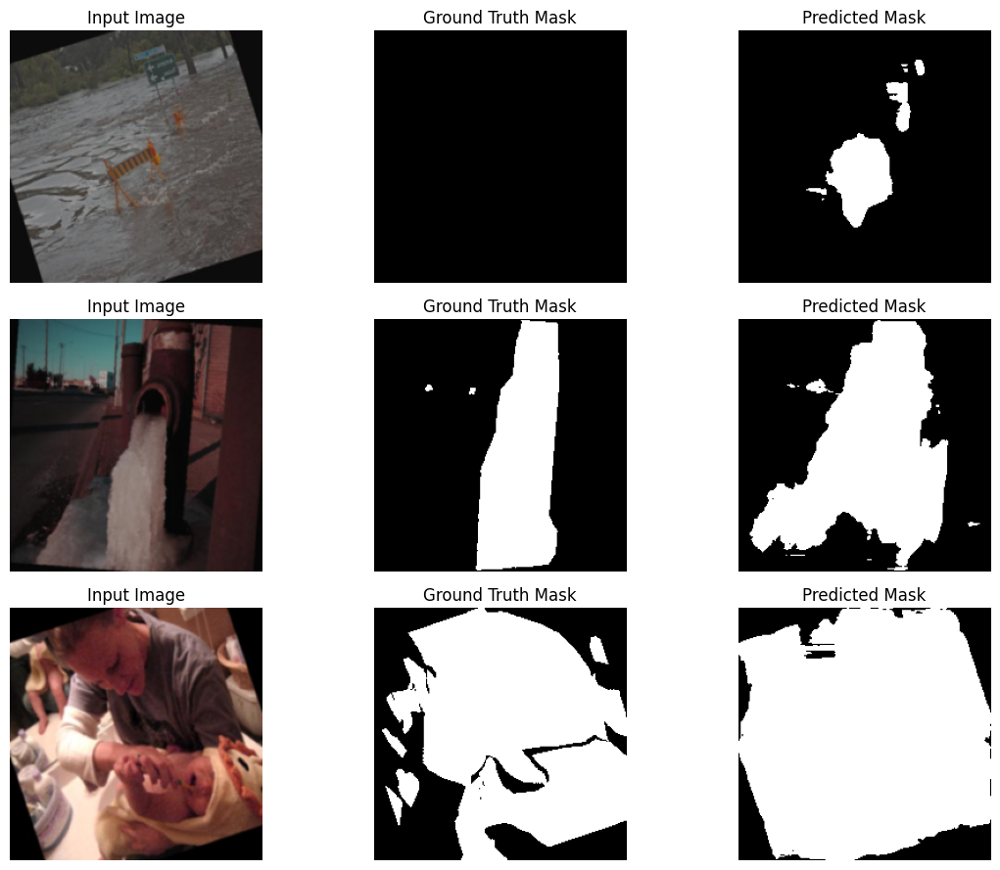

Epoch 71, Batch 0/200
Epoch 71, Batch 10/200
Epoch 71, Batch 20/200
Epoch 71, Batch 30/200
Epoch 71, Batch 40/200
Epoch 71, Batch 50/200
Epoch 71, Batch 60/200
Epoch 71, Batch 70/200
Epoch 71, Batch 80/200
Epoch 71, Batch 90/200
Epoch 71, Batch 100/200
Epoch 71, Batch 110/200
Epoch 71, Batch 120/200
Epoch 71, Batch 130/200
Epoch 71, Batch 140/200
Epoch 71, Batch 150/200
Epoch 71, Batch 160/200
Epoch 71, Batch 170/200
Epoch 71, Batch 180/200
Epoch 71, Batch 190/200
Epoch 71/76, Train Loss: 0.4037, Val Loss: 0.3845, Val IoU: 0.4511
Epoch 72, Batch 0/200
Epoch 72, Batch 10/200
Epoch 72, Batch 20/200
Epoch 72, Batch 30/200
Epoch 72, Batch 40/200
Epoch 72, Batch 50/200
Epoch 72, Batch 60/200
Epoch 72, Batch 70/200
Epoch 72, Batch 80/200
Epoch 72, Batch 90/200
Epoch 72, Batch 100/200
Epoch 72, Batch 110/200
Epoch 72, Batch 120/200
Epoch 72, Batch 130/200
Epoch 72, Batch 140/200
Epoch 72, Batch 150/200
Epoch 72, Batch 160/200
Epoch 72, Batch 170/200
Epoch 72, Batch 180/200
Epoch 72, Batch 190

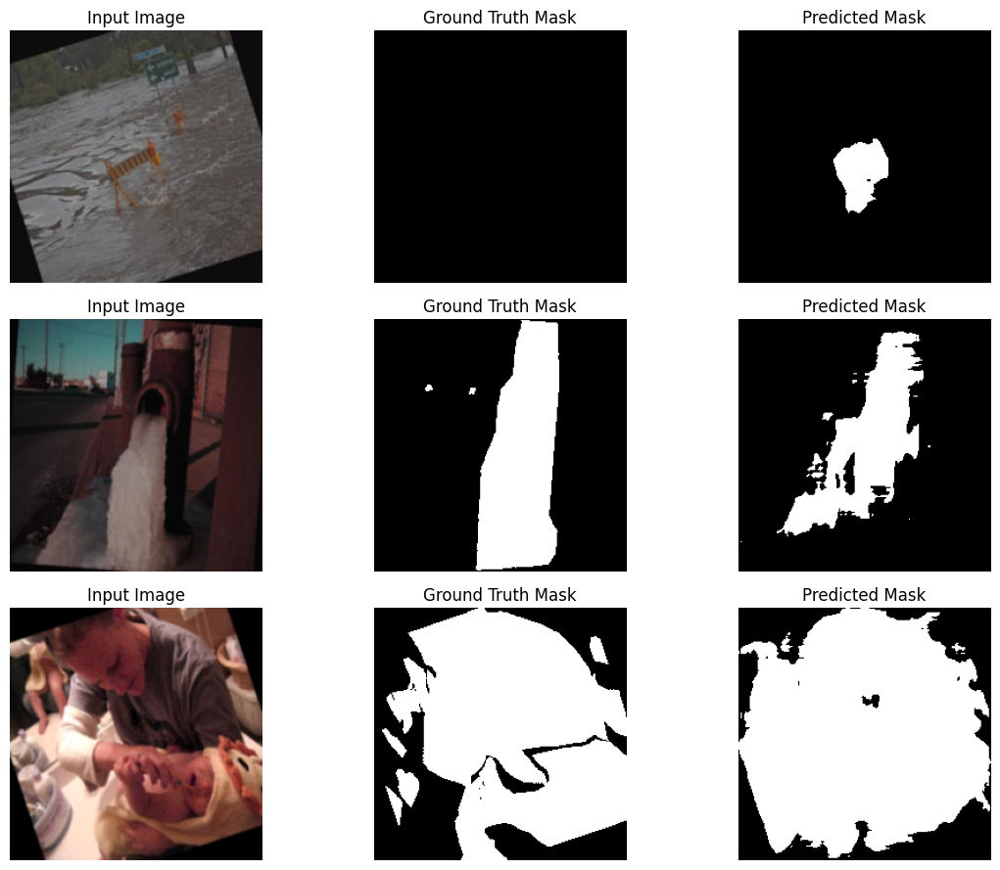

Epoch 73, Batch 0/200
Epoch 73, Batch 10/200
Epoch 73, Batch 20/200
Epoch 73, Batch 30/200
Epoch 73, Batch 40/200
Epoch 73, Batch 50/200
Epoch 73, Batch 60/200
Epoch 73, Batch 70/200
Epoch 73, Batch 80/200
Epoch 73, Batch 90/200
Epoch 73, Batch 100/200
Epoch 73, Batch 110/200
Epoch 73, Batch 120/200
Epoch 73, Batch 130/200
Epoch 73, Batch 140/200
Epoch 73, Batch 150/200
Epoch 73, Batch 160/200
Epoch 73, Batch 170/200
Epoch 73, Batch 180/200
Epoch 73, Batch 190/200
Epoch 73/76, Train Loss: 0.3800, Val Loss: 0.4026, Val IoU: 0.4745
Epoch 74, Batch 0/200
Epoch 74, Batch 10/200
Epoch 74, Batch 20/200
Epoch 74, Batch 30/200
Epoch 74, Batch 40/200
Epoch 74, Batch 50/200
Epoch 74, Batch 60/200
Epoch 74, Batch 70/200
Epoch 74, Batch 80/200
Epoch 74, Batch 90/200
Epoch 74, Batch 100/200
Epoch 74, Batch 110/200
Epoch 74, Batch 120/200
Epoch 74, Batch 130/200
Epoch 74, Batch 140/200
Epoch 74, Batch 150/200
Epoch 74, Batch 160/200
Epoch 74, Batch 170/200
Epoch 74, Batch 180/200
Epoch 74, Batch 190

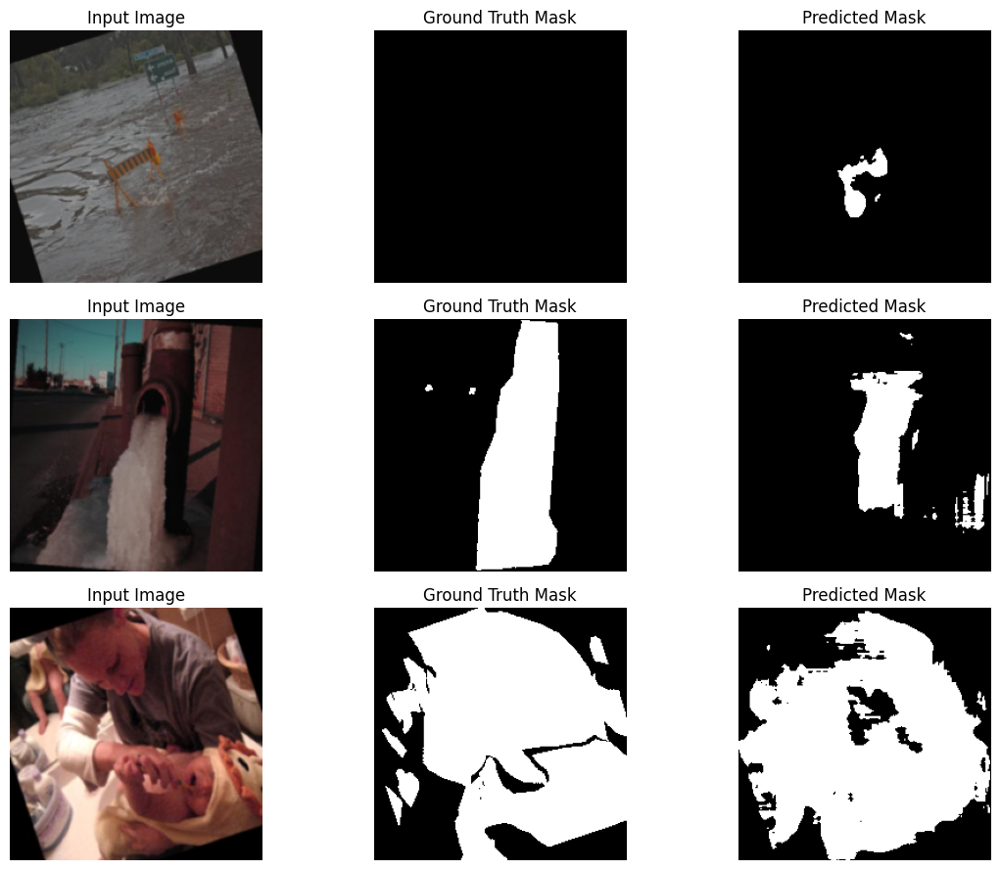

Epoch 75, Batch 0/200
Epoch 75, Batch 10/200
Epoch 75, Batch 20/200
Epoch 75, Batch 30/200
Epoch 75, Batch 40/200
Epoch 75, Batch 50/200
Epoch 75, Batch 60/200
Epoch 75, Batch 70/200
Epoch 75, Batch 80/200
Epoch 75, Batch 90/200
Epoch 75, Batch 100/200
Epoch 75, Batch 110/200
Epoch 75, Batch 120/200
Epoch 75, Batch 130/200
Epoch 75, Batch 140/200
Epoch 75, Batch 150/200
Epoch 75, Batch 160/200
Epoch 75, Batch 170/200
Epoch 75, Batch 180/200
Epoch 75, Batch 190/200
Epoch 75/76, Train Loss: 0.3669, Val Loss: 0.3904, Val IoU: 0.4908
Epoch 76, Batch 0/200
Epoch 76, Batch 10/200
Epoch 76, Batch 20/200
Epoch 76, Batch 30/200
Epoch 76, Batch 40/200
Epoch 76, Batch 50/200
Epoch 76, Batch 60/200
Epoch 76, Batch 70/200
Epoch 76, Batch 80/200
Epoch 76, Batch 90/200
Epoch 76, Batch 100/200
Epoch 76, Batch 110/200
Epoch 76, Batch 120/200
Epoch 76, Batch 130/200
Epoch 76, Batch 140/200
Epoch 76, Batch 150/200
Epoch 76, Batch 160/200
Epoch 76, Batch 170/200
Epoch 76, Batch 180/200
Epoch 76, Batch 190

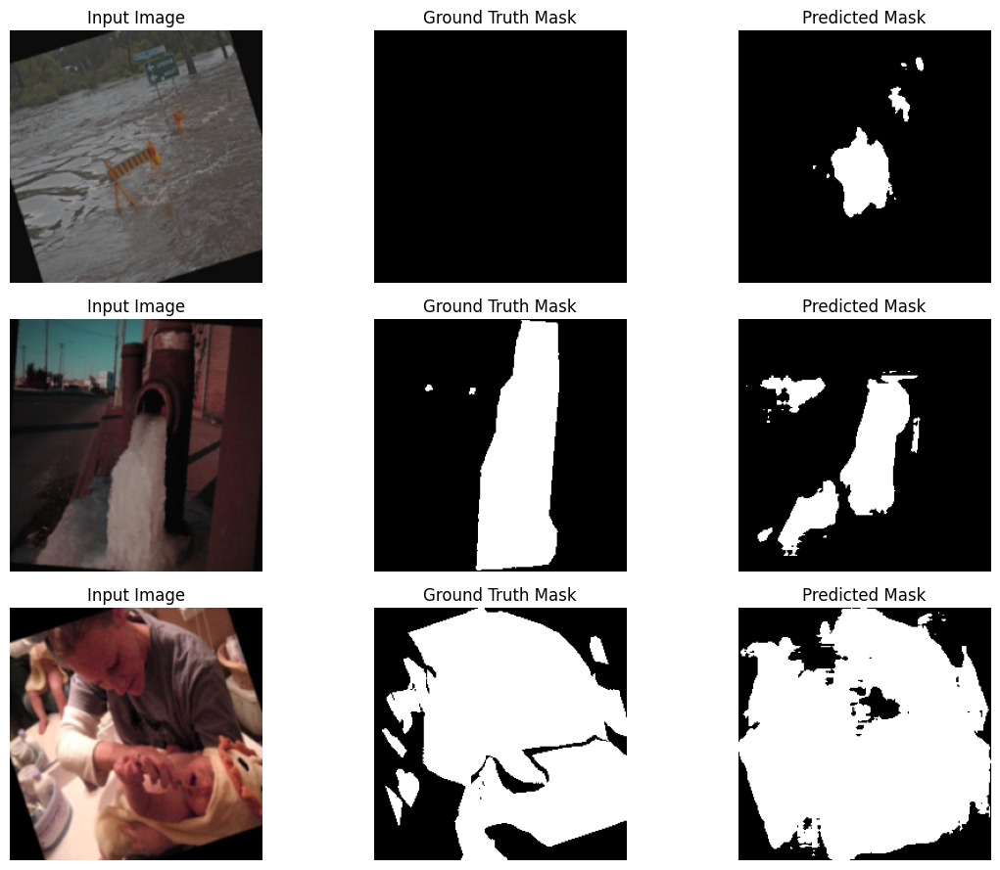

In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 8  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 76
Epoch 77, Batch 0/200
Epoch 77, Batch 10/200
Epoch 77, Batch 20/200
Epoch 77, Batch 30/200
Epoch 77, Batch 40/200
Epoch 77, Batch 50/200
Epoch 77, Batch 60/200
Epoch 77, Batch 70/200
Epoch 77, Batch 80/200
Epoch 77, Batch 90/200
Epoch 77, Batch 100/200
Epoch 77, Batch 110/200
Epoch 77, Batch 120/200
Epoch 77, Batch 130/200
Epoch 77, Batch 140/200
Epoch 77, Batch 150/200
Epoch 77, Batch 160/200
Epoch 77, Batch 170/200
Epoch 77, Batch 180/200
Epoch 77, Batch 190/200
Epoch 77/84, Train Loss: 0.4434, Val Loss: 0.4510, Val IoU: 0.2692
Epoch 78, Batch 0/200
Epoch 78, Batch 10/200
Epoch 78, Batch 20/200
Epoch 78, Batch 30/200
Epoch 78, Batch 40/200
Epoch 78, Batch 50/200
Epoch 78, Batch 60/200
Epoch 78, Batch 70/200
Epoch 78, Batch 80/200
Epoch 78, Batch 90/200
Epoch 78, Batch 100/200
Epoch 78, Batch 110/200
Epoch 78, Batch 120/200
Epoch 78, Batch 130/200
Epoch 78, Batch 140/200
Epoch 78, Batch 150/200
Epoch 78, Batch 160/200
Epoch 78, Batch 170/200
Epoch 78, Batch 180/

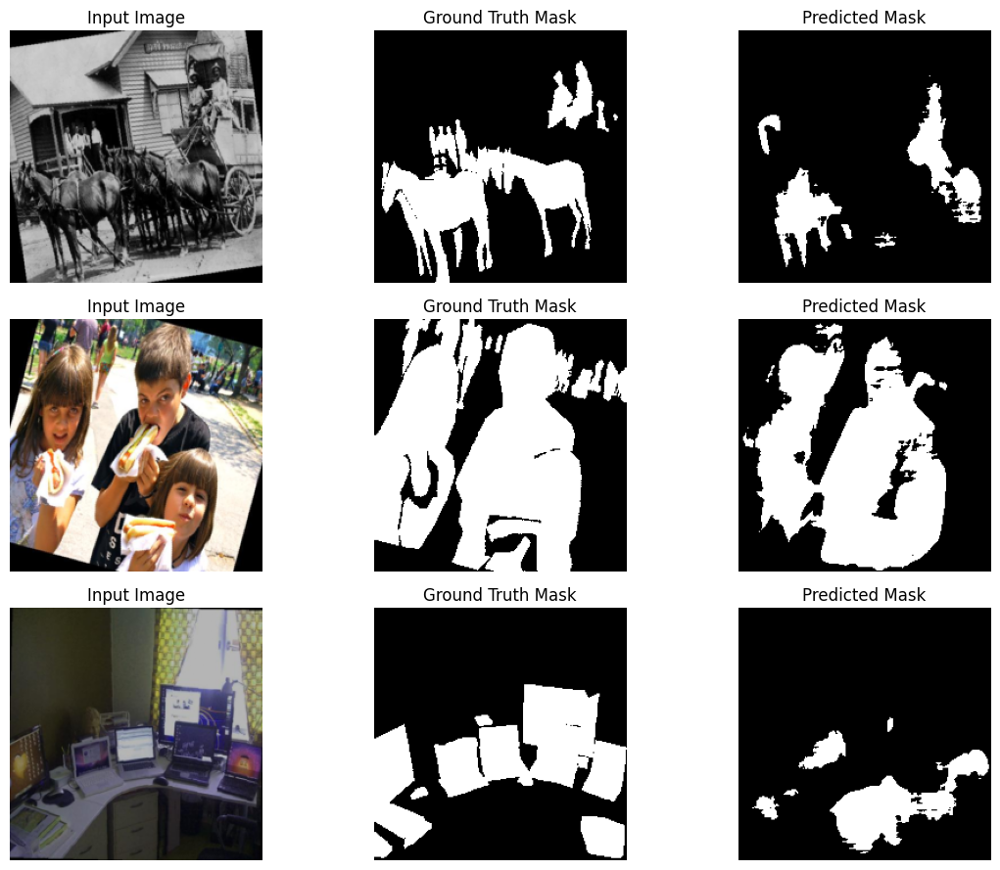

Epoch 79, Batch 0/200
Epoch 79, Batch 10/200
Epoch 79, Batch 20/200
Epoch 79, Batch 30/200
Epoch 79, Batch 40/200
Epoch 79, Batch 50/200
Epoch 79, Batch 60/200
Epoch 79, Batch 70/200
Epoch 79, Batch 80/200
Epoch 79, Batch 90/200
Epoch 79, Batch 100/200
Epoch 79, Batch 110/200
Epoch 79, Batch 120/200
Epoch 79, Batch 130/200
Epoch 79, Batch 140/200
Epoch 79, Batch 150/200
Epoch 79, Batch 160/200
Epoch 79, Batch 170/200
Epoch 79, Batch 180/200
Epoch 79, Batch 190/200
Epoch 79/84, Train Loss: 0.4073, Val Loss: 0.4199, Val IoU: 0.4344
Epoch 80, Batch 0/200
Epoch 80, Batch 10/200
Epoch 80, Batch 20/200
Epoch 80, Batch 30/200
Epoch 80, Batch 40/200
Epoch 80, Batch 50/200
Epoch 80, Batch 60/200
Epoch 80, Batch 70/200
Epoch 80, Batch 80/200
Epoch 80, Batch 90/200
Epoch 80, Batch 100/200
Epoch 80, Batch 110/200
Epoch 80, Batch 120/200
Epoch 80, Batch 130/200
Epoch 80, Batch 140/200
Epoch 80, Batch 150/200
Epoch 80, Batch 160/200
Epoch 80, Batch 170/200
Epoch 80, Batch 180/200
Epoch 80, Batch 190

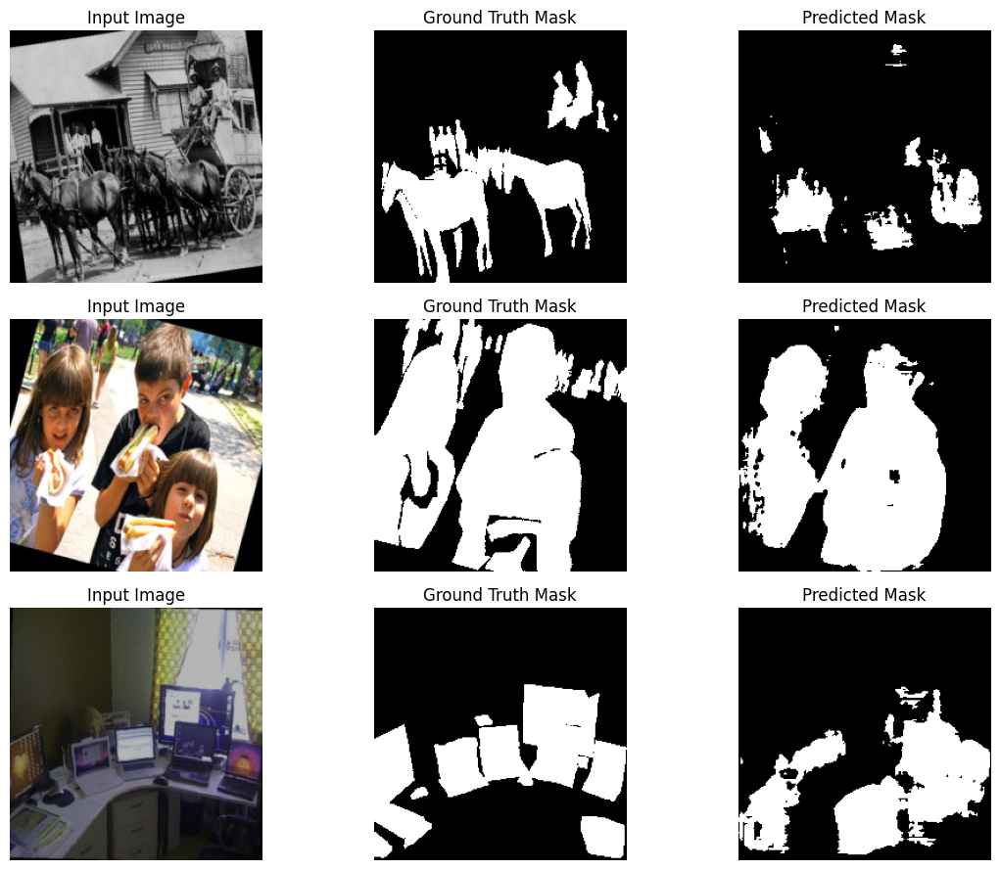

Epoch 81, Batch 0/200
Epoch 81, Batch 10/200
Epoch 81, Batch 20/200
Epoch 81, Batch 30/200
Epoch 81, Batch 40/200
Epoch 81, Batch 50/200
Epoch 81, Batch 60/200
Epoch 81, Batch 70/200
Epoch 81, Batch 80/200
Epoch 81, Batch 90/200
Epoch 81, Batch 100/200
Epoch 81, Batch 110/200
Epoch 81, Batch 120/200
Epoch 81, Batch 130/200
Epoch 81, Batch 140/200
Epoch 81, Batch 150/200
Epoch 81, Batch 160/200
Epoch 81, Batch 170/200
Epoch 81, Batch 180/200
Epoch 81, Batch 190/200
Epoch 81/84, Train Loss: 0.3890, Val Loss: 0.4281, Val IoU: 0.4384
Epoch 82, Batch 0/200
Epoch 82, Batch 10/200
Epoch 82, Batch 20/200
Epoch 82, Batch 30/200
Epoch 82, Batch 40/200
Epoch 82, Batch 50/200
Epoch 82, Batch 60/200
Epoch 82, Batch 70/200
Epoch 82, Batch 80/200
Epoch 82, Batch 90/200
Epoch 82, Batch 100/200
Epoch 82, Batch 110/200
Epoch 82, Batch 120/200
Epoch 82, Batch 130/200
Epoch 82, Batch 140/200
Epoch 82, Batch 150/200
Epoch 82, Batch 160/200
Epoch 82, Batch 170/200
Epoch 82, Batch 180/200
Epoch 82, Batch 190

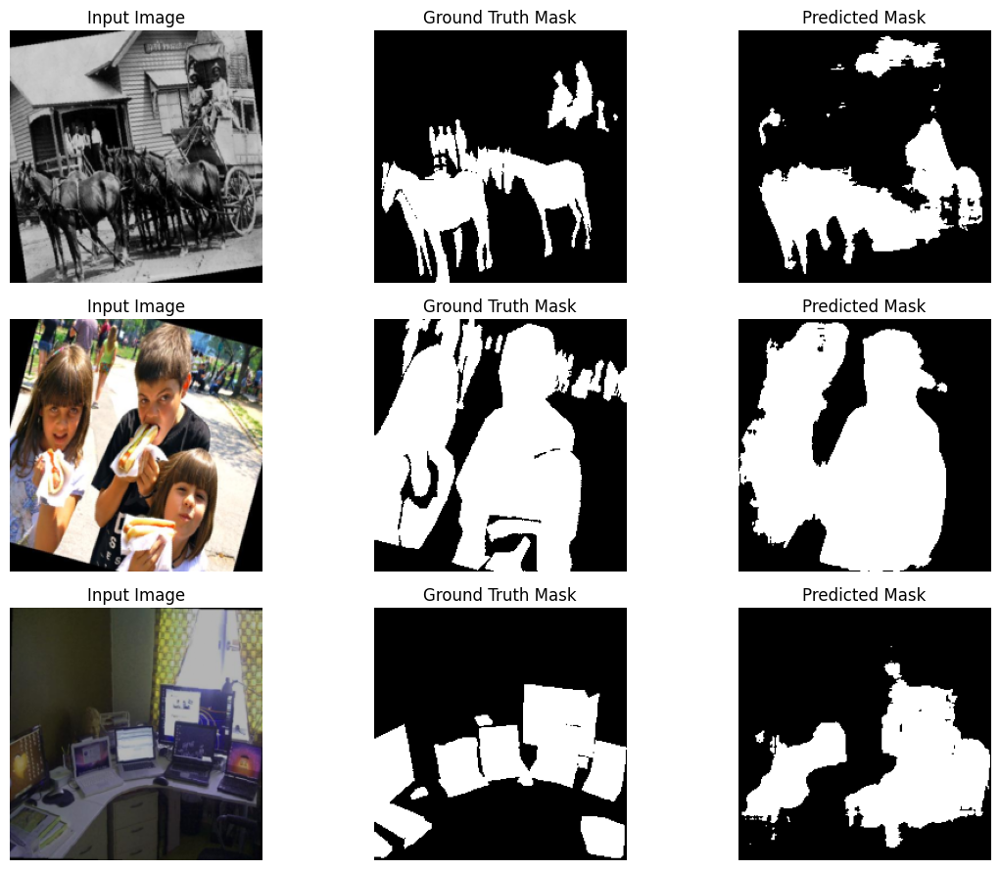

Epoch 83, Batch 0/200
Epoch 83, Batch 10/200
Epoch 83, Batch 20/200


KeyboardInterrupt: 

In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 8  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 82
Epoch 83, Batch 0/200
Epoch 83, Batch 10/200
Epoch 83, Batch 20/200
Epoch 83, Batch 30/200
Epoch 83, Batch 40/200
Epoch 83, Batch 50/200
Epoch 83, Batch 60/200
Epoch 83, Batch 70/200
Epoch 83, Batch 80/200
Epoch 83, Batch 90/200
Epoch 83, Batch 100/200
Epoch 83, Batch 110/200
Epoch 83, Batch 120/200
Epoch 83, Batch 130/200
Epoch 83, Batch 140/200
Epoch 83, Batch 150/200
Epoch 83, Batch 160/200
Epoch 83, Batch 170/200
Epoch 83, Batch 180/200
Epoch 83, Batch 190/200
Epoch 83/87, Train Loss: 0.4241, Val Loss: 0.3864, Val IoU: 0.4990
Epoch 84, Batch 0/200
Epoch 84, Batch 10/200
Epoch 84, Batch 20/200
Epoch 84, Batch 30/200
Epoch 84, Batch 40/200
Epoch 84, Batch 50/200
Epoch 84, Batch 60/200
Epoch 84, Batch 70/200
Epoch 84, Batch 80/200
Epoch 84, Batch 90/200
Epoch 84, Batch 100/200
Epoch 84, Batch 110/200
Epoch 84, Batch 120/200
Epoch 84, Batch 130/200
Epoch 84, Batch 140/200
Epoch 84, Batch 150/200
Epoch 84, Batch 160/200
Epoch 84, Batch 170/200
Epoch 84, Batch 180/

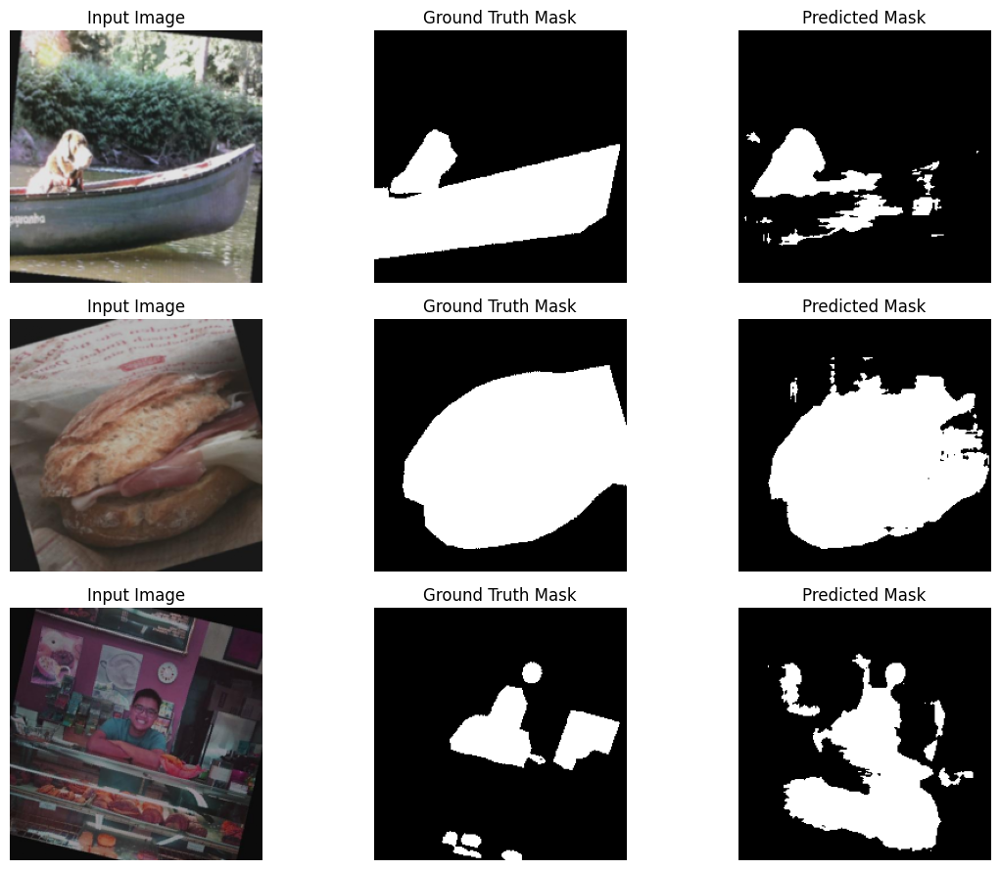

Epoch 85, Batch 0/200
Epoch 85, Batch 10/200
Epoch 85, Batch 20/200
Epoch 85, Batch 30/200
Epoch 85, Batch 40/200
Epoch 85, Batch 50/200
Epoch 85, Batch 60/200
Epoch 85, Batch 70/200
Epoch 85, Batch 80/200
Epoch 85, Batch 90/200
Epoch 85, Batch 100/200
Epoch 85, Batch 110/200
Epoch 85, Batch 120/200
Epoch 85, Batch 130/200
Epoch 85, Batch 140/200
Epoch 85, Batch 150/200
Epoch 85, Batch 160/200
Epoch 85, Batch 170/200
Epoch 85, Batch 180/200
Epoch 85, Batch 190/200
Epoch 85/87, Train Loss: 0.3915, Val Loss: 0.3855, Val IoU: 0.4123
Epoch 86, Batch 0/200
Epoch 86, Batch 10/200
Epoch 86, Batch 20/200
Epoch 86, Batch 30/200
Epoch 86, Batch 40/200
Epoch 86, Batch 50/200
Epoch 86, Batch 60/200
Epoch 86, Batch 70/200
Epoch 86, Batch 80/200
Epoch 86, Batch 90/200
Epoch 86, Batch 100/200
Epoch 86, Batch 110/200
Epoch 86, Batch 120/200
Epoch 86, Batch 130/200
Epoch 86, Batch 140/200
Epoch 86, Batch 150/200
Epoch 86, Batch 160/200
Epoch 86, Batch 170/200
Epoch 86, Batch 180/200
Epoch 86, Batch 190

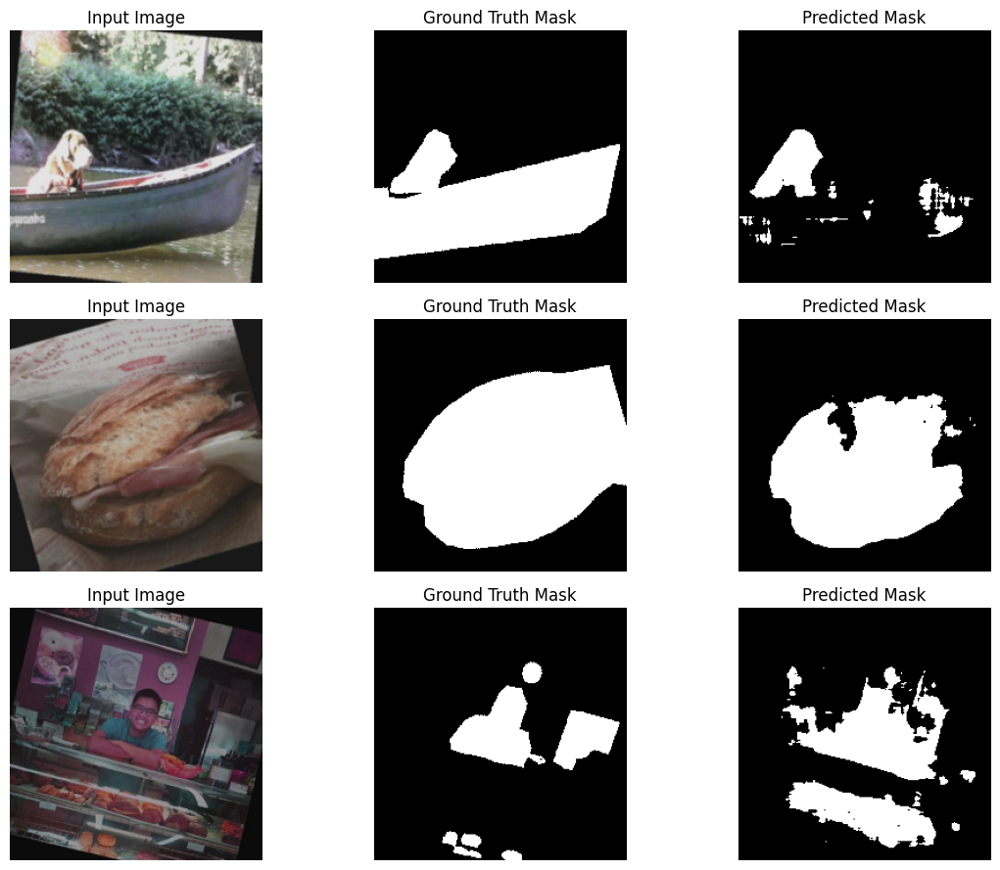

Epoch 87, Batch 0/200
Epoch 87, Batch 10/200
Epoch 87, Batch 20/200
Epoch 87, Batch 30/200
Epoch 87, Batch 40/200
Epoch 87, Batch 50/200
Epoch 87, Batch 60/200
Epoch 87, Batch 70/200
Epoch 87, Batch 80/200
Epoch 87, Batch 90/200
Epoch 87, Batch 100/200
Epoch 87, Batch 110/200
Epoch 87, Batch 120/200
Epoch 87, Batch 130/200
Epoch 87, Batch 140/200
Epoch 87, Batch 150/200
Epoch 87, Batch 160/200
Epoch 87, Batch 170/200


In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 5 # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)


Resuming from epoch 86
Epoch 87, Batch 0/200
Epoch 87, Batch 10/200
Epoch 87, Batch 20/200
Epoch 87, Batch 30/200
Epoch 87, Batch 40/200
Epoch 87, Batch 50/200
Epoch 87, Batch 60/200
Epoch 87, Batch 70/200
Epoch 87, Batch 80/200
Epoch 87, Batch 90/200
Epoch 87, Batch 100/200
Epoch 87, Batch 110/200
Epoch 87, Batch 120/200
Epoch 87, Batch 130/200
Epoch 87, Batch 140/200
Epoch 87, Batch 150/200
Epoch 87, Batch 160/200
Epoch 87, Batch 170/200
Epoch 87, Batch 180/200
Epoch 87, Batch 190/200
Epoch 87/92, Train Loss: 0.4133, Val Loss: 0.4112, Val IoU: 0.4398
Epoch 88, Batch 0/200
Epoch 88, Batch 10/200
Epoch 88, Batch 20/200
Epoch 88, Batch 30/200
Epoch 88, Batch 40/200
Epoch 88, Batch 50/200
Epoch 88, Batch 60/200
Epoch 88, Batch 70/200
Epoch 88, Batch 80/200
Epoch 88, Batch 90/200
Epoch 88, Batch 100/200
Epoch 88, Batch 110/200
Epoch 88, Batch 120/200
Epoch 88, Batch 130/200
Epoch 88, Batch 140/200
Epoch 88, Batch 150/200
Epoch 88, Batch 160/200
Epoch 88, Batch 170/200
Epoch 88, Batch 180/

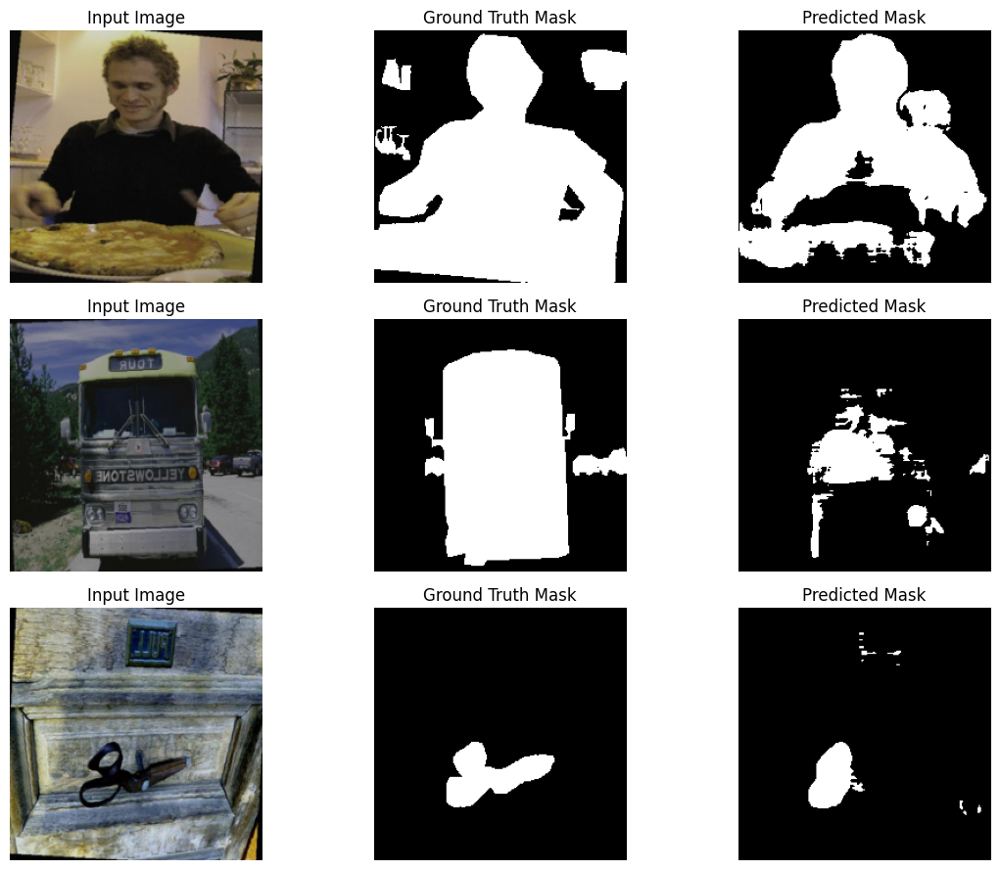

Epoch 89, Batch 0/200
Epoch 89, Batch 10/200
Epoch 89, Batch 20/200
Epoch 89, Batch 30/200
Epoch 89, Batch 40/200
Epoch 89, Batch 50/200
Epoch 89, Batch 60/200
Epoch 89, Batch 70/200
Epoch 89, Batch 80/200
Epoch 89, Batch 90/200
Epoch 89, Batch 100/200
Epoch 89, Batch 110/200
Epoch 89, Batch 120/200
Epoch 89, Batch 130/200
Epoch 89, Batch 140/200
Epoch 89, Batch 150/200
Epoch 89, Batch 160/200
Epoch 89, Batch 170/200
Epoch 89, Batch 180/200
Epoch 89, Batch 190/200
Epoch 89/92, Train Loss: 0.3758, Val Loss: 0.4167, Val IoU: 0.5020
Epoch 90, Batch 0/200
Epoch 90, Batch 10/200
Epoch 90, Batch 20/200
Epoch 90, Batch 30/200
Epoch 90, Batch 40/200
Epoch 90, Batch 50/200
Epoch 90, Batch 60/200
Epoch 90, Batch 70/200
Epoch 90, Batch 80/200
Epoch 90, Batch 90/200
Epoch 90, Batch 100/200
Epoch 90, Batch 110/200
Epoch 90, Batch 120/200
Epoch 90, Batch 130/200
Epoch 90, Batch 140/200
Epoch 90, Batch 150/200
Epoch 90, Batch 160/200
Epoch 90, Batch 170/200
Epoch 90, Batch 180/200
Epoch 90, Batch 190

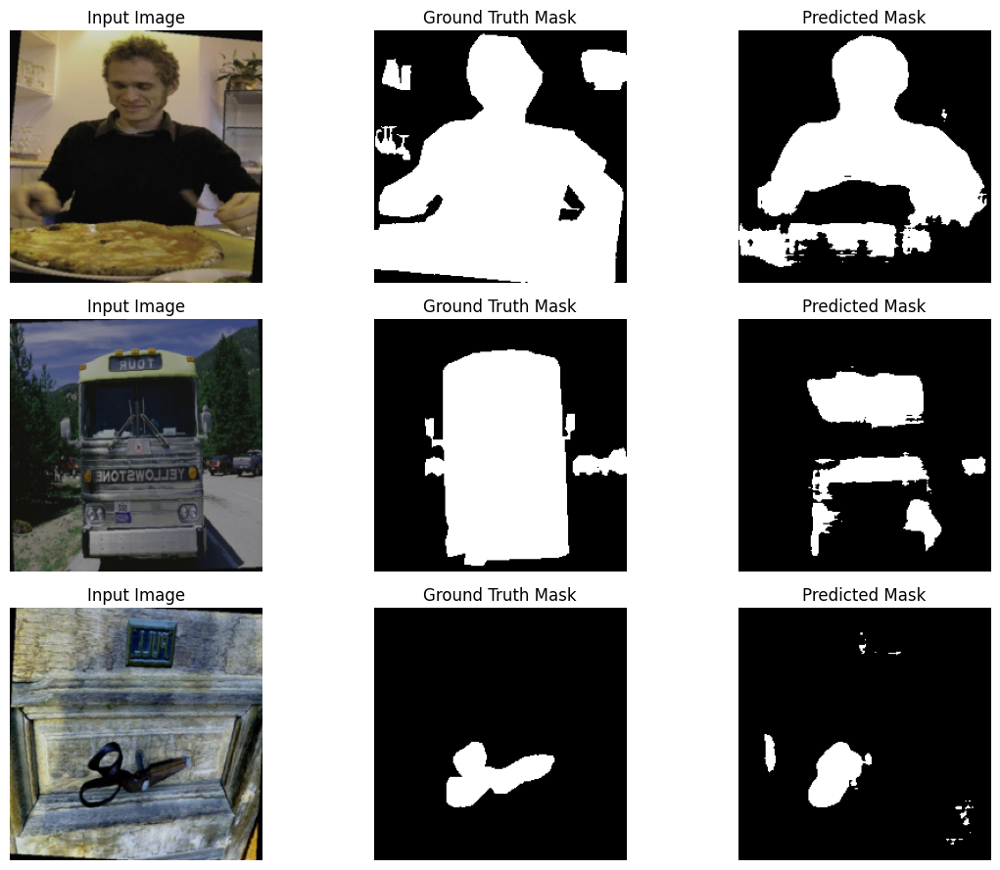

Epoch 91, Batch 0/200
Epoch 91, Batch 10/200
Epoch 91, Batch 20/200
Epoch 91, Batch 30/200
Epoch 91, Batch 40/200
Epoch 91, Batch 50/200
Epoch 91, Batch 60/200
Epoch 91, Batch 70/200


In [ ]:
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.BCELoss()
num_new_epochs = 6  # How many more epochs you want on the new batch

# Load checkpoint to resume incremental learning
checkpoint_path = '/content/drive/MyDrive/unet_checkpoint.pth'
start_epoch = 0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming from epoch {start_epoch}")
else:
    print("No checkpoint found, starting fresh")

# Now ensure loop actually runs for more epochs!
num_epochs = start_epoch + num_new_epochs

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0
    plt.figure(figsize=(12, num_samples * 3))
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            preds = (preds > 0.5).float().cpu()
            images, masks = images.cpu(), masks.cpu()
            for i in range(images.size(0)):
                if shown >= num_samples:
                    break
                plt.subplot(num_samples, 3, shown*3 + 1)
                plt.imshow(images[i].permute(1, 2, 0))
                plt.title("Input Image")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 2)
                plt.imshow(masks[i][0], cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')
                plt.subplot(num_samples, 3, shown*3 + 3)
                plt.imshow(preds[i][0], cmap='gray')
                plt.title("Predicted Mask")
                plt.axis('off')
                shown += 1
            if shown >= num_samples:
                break
    plt.tight_layout()
    plt.show()

for epoch in range(start_epoch, num_epochs):
    model.train()
    train_loss = 0
    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        preds = model(images)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        if batch_idx % 10 == 0:
            print(f"Epoch {epoch+1}, Batch {batch_idx}/{len(train_loader)}")
    train_loss /= len(train_loader)

    model.eval()
    val_loss, val_iou = 0, 0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            preds = model(images)
            val_loss += criterion(preds, masks).item()
            val_iou += iou_score(preds, masks)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")

    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, checkpoint_path)

    if (epoch + 1) % 2 == 0:
        print(f"Visualizing predictions after epoch {epoch+1}")
        visualize_predictions(model, val_loader, device, num_samples=3)
